In [2]:
tissues_with_atac = ['CHO','Brain','Liver','Lung','Kidney','Spleen','BMDMwt','BMDM1hKLA']

In [3]:
## Parameters specific to where your folders are and your data
parameter_file = 'params/params.yaml'
import yaml
import sys

with open(parameter_file,'r') as f:
    doc = yaml.load(f)

#p = dic2obj(**doc)

data_folder = doc['data_folder']
tissues = doc['tissues'].split(',')
sys.path.append(doc['pipeline_path'])
ref_fa = doc['ref_fa']
annotation=doc['annotation']


In [4]:
tss_annotation = doc['tss_annotation']

In [5]:
tss_annotation = doc['tss_annotation']

In [6]:

import os
import sys
import pandas as pd
import matplotlib
import seaborn as sns
import pickle
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from itertools import product
import glob
import re
from matplotlib_venn import venn2
from matplotlib import rcParams
import inspect
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sys.setrecursionlimit(3000)
%load_ext autoreload
%autoreload 2
rcParams['figure.figsize'] = 8, 6
import tqdm
### notebook specific configuration ###
from os.path import basename
#mpl.style.use('ggplot')
mpl.style.use('fivethirtyeight')
from cycler import cycler
mpl.rcParams['axes.prop_cycle'] = cycler(color='bgrcmyk')

from Modules.Homer import *

print('Number of tissues: ',len(tissues))

('Number of tissues: ', 16)


In [7]:
data_folder = '../Processed/'

In [8]:
from IPython.display import Image
from IPython.display import display

In [9]:
## Parameters specific to where your folders are and your data
parameter_file = 'params/params.yaml'
import yaml
import sys

with open(parameter_file,'r') as f:
    doc = yaml.load(f)

#p = dic2obj(**doc)

data_folder = doc['data_folder']
tissues = doc['tissues'].split(',')
sys.path.append(doc['pipeline_path'])
ref_fa = doc['ref_fa']
annotation=doc['annotation']


tss_annotation = doc['tss_annotation']


import os
import sys
import pandas as pd
import matplotlib
import seaborn as sns
import pickle
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from itertools import product
import glob
import re
from matplotlib_venn import venn2
from matplotlib import rcParams
import inspect
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sys.setrecursionlimit(3000)
%load_ext autoreload
%autoreload 2
rcParams['figure.figsize'] = 8, 6
import tqdm
### notebook specific configuration ###
from os.path import basename
#mpl.style.use('ggplot')
mpl.style.use('fivethirtyeight')
from cycler import cycler
mpl.rcParams['axes.prop_cycle'] = cycler(color='bgrcmyk')

from Modules.Homer import *

print('Number of tissues: ',len(tissues))

data_folder = '../Processed/'

from IPython.display import Image
from IPython.display import display
import os
import sys
import pandas as pd
import matplotlib
import seaborn as sns
import pickle
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from itertools import product
import glob
import re
from matplotlib_venn import venn2
from matplotlib import rcParams
import inspect
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sys.setrecursionlimit(3000)
%load_ext autoreload
%autoreload 2
rcParams['figure.figsize'] = 8, 6
import tqdm
### notebook specific configuration ###
from os.path import basename
#mpl.style.use('ggplot')
mpl.style.use('fivethirtyeight')
from cycler import cycler
mpl.rcParams['axes.prop_cycle'] = cycler(color='bgrcmyk')

from Modules.Homer import *

print('Number of tissues: ',len(tissues))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
('Number of tissues: ', 16)
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
('Number of tissues: ', 16)


In [10]:
data_folder = '../Processed/'

In [11]:
from IPython.display import Image
from IPython.display import display

In [13]:
def run_heatmap(bed,bigwig,outfile,dist=2000,numProc=6,
                dispImage = False,computeMat_args = '',plotHeat_args = '',
               is_tss_f = ''):
    
    
    cmd = 'computeMatrix reference-point -S {bw} -R {bd} -a {d} -b {d} -out {out} --numberOfProcessors {p} {args}'.format(
        bw=bigwig, bd = tss_bed,d=dist,out=outfile,p=numProc,args=computeMat_args)
    print(cmd)
    !{cmd}   
    
    cmd = """plotHeatmap\
     -m {out}\
     -out {out}.png \
     --heatmapHeight 15  \
     --refPointLabel TSS.center \
     --regionsLabel TSS \
     --plotTitle 'ATAC signal' {args}""".format(out=outfile,args = plotHeat_args)

    print(cmd)
    !{cmd}
    
    
    if dispImage:
        return Image(filename=outfile + '.png')
    return

### Compare with Homer

In [40]:
tss_bed = 'Results/tss_final/tss_peakCenter.bed'
bigwig = '../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw'
outfile = 'Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO'

cmd = '''computeMatrix reference-point -S %s -R %s -a 250 -b 250 -out %s --numberOfProcessors 6''' % (
    bigwig, tss_bed,outfile)
print(cmd)
!{cmd}



cmd = """plotHeatmap\
 -m %s\
 -out %s.png \
 --refPointLabel TSS.center \
 --regionsLabel TSS \
 --plotTitle 'ATAC signal'"""  % (outfile,outfile)
    
print(cmd)
!{cmd}

Image(filename=outfile + '.png')

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/tss_final/tss_peakCenter.bed -a 250 -b 250 -out Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO --numberOfProcessors 6
Skipping IGHV3-74;gene_7002;asmbl_20945;Lung_mSTART;cs=4, due to being absent in the computeMatrix output.
plotHeatmap -m Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO -out Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO.png  --refPointLabel TSS.center  --regionsLabel TSS  --plotTitle 'ATAC signal'
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



## Look at specific peak groups

#  Specific for each tissue

In [ ]:
tissues_with_atac = ['CHO','Brain','Liver','Lung','Kidney','Spleen','BMDMwt']#,'BMDM1hKLA']

CHO
computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/CHO/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/CHO/confident_promoters     -out Results/ATAC_results/CHO/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


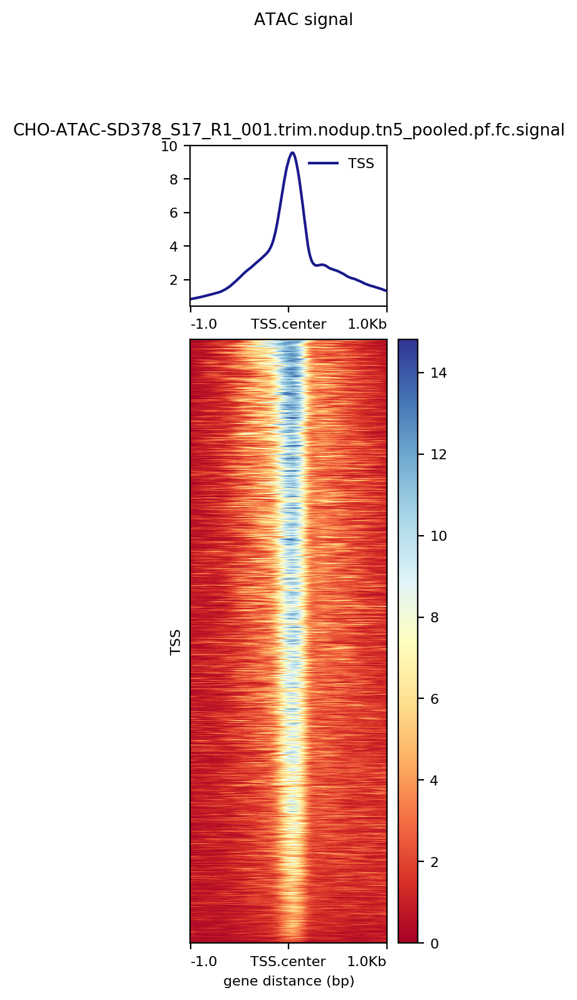

computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/CHO/no_peaks --numberOfProcessors 6 
Skipping ID=asmbl_20945;Parent=gene_7002;gene_id=gene_7002;gene=IGHV3-74;transcript_id=asmbl_20945;cs=4, due to being absent in the computeMatrix output.
plotHeatmap     -m Results/ATAC_results/CHO/no_peaks     -out Results/ATAC_results/CHO/no_peaks.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


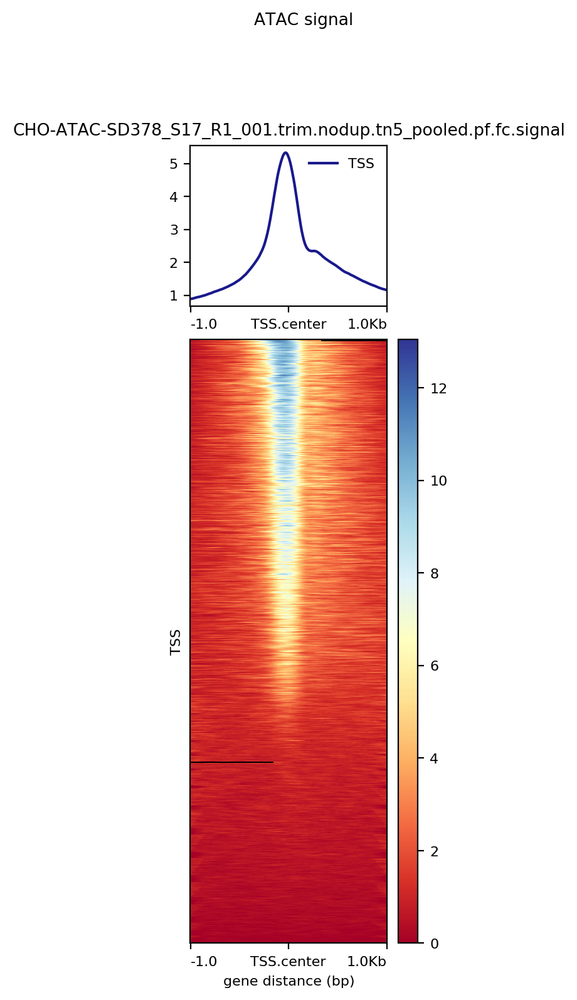

computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_enhancers.bed -a 1000 -b 1000 -out Results/ATAC_results/CHO/confident_enhancers --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/CHO/confident_enhancers     -out Results/ATAC_results/CHO/confident_enhancers.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


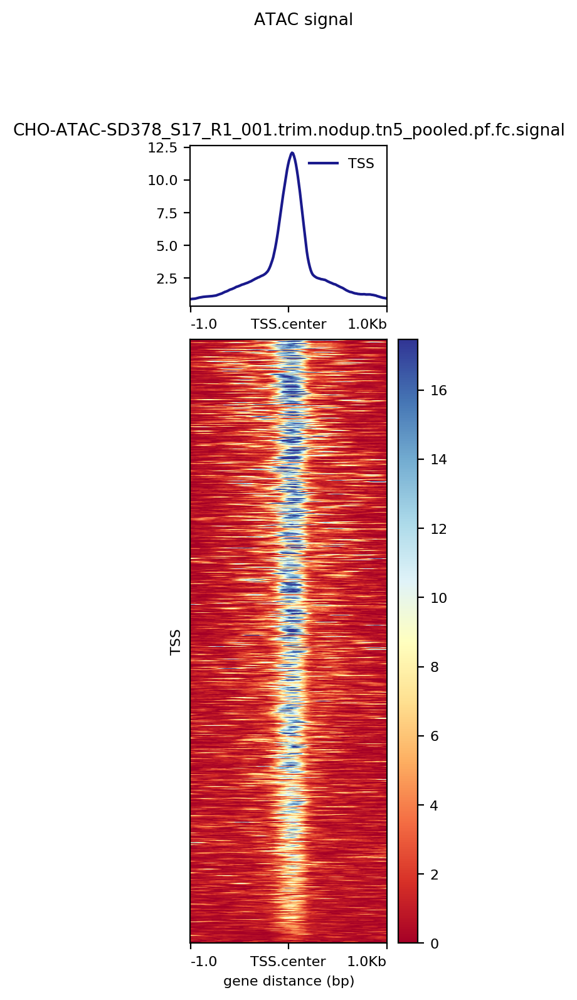

computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_promoters.bed -a 250 -b 250 -out Results/ATAC_results/CHO/confident_promoters_sorted_distance --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/CHO/confident_promoters_sorted_distance     -out Results/ATAC_results/CHO/confident_promoters_sorted_distance.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


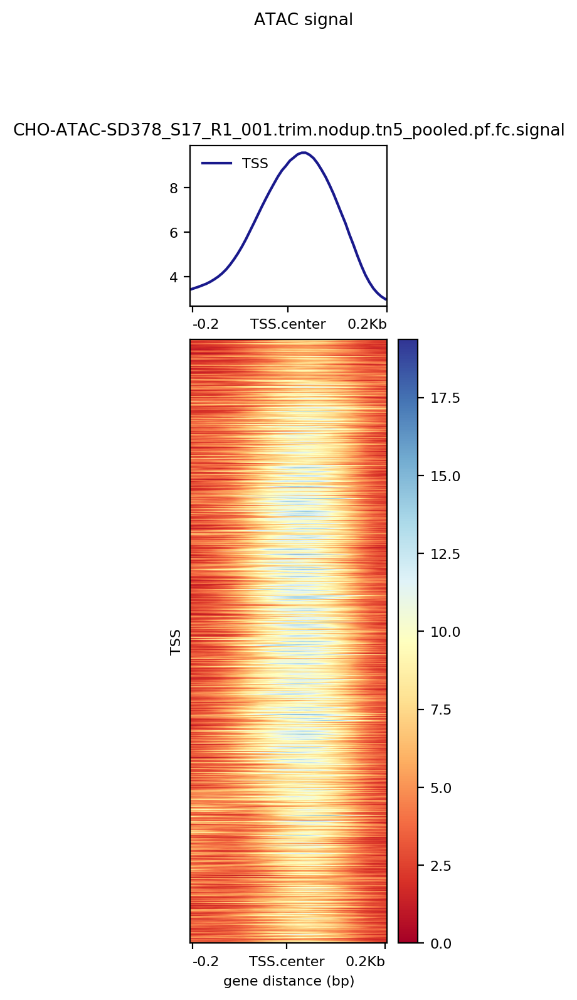

computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_promoters_noDiv_PICR.bed -a 250 -b 250 -out Results/ATAC_results/CHO/confident_promoters_noDiv_PICR --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/CHO/confident_promoters_noDiv_PICR     -out Results/ATAC_results/CHO/confident_promoters_noDiv_PICR.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


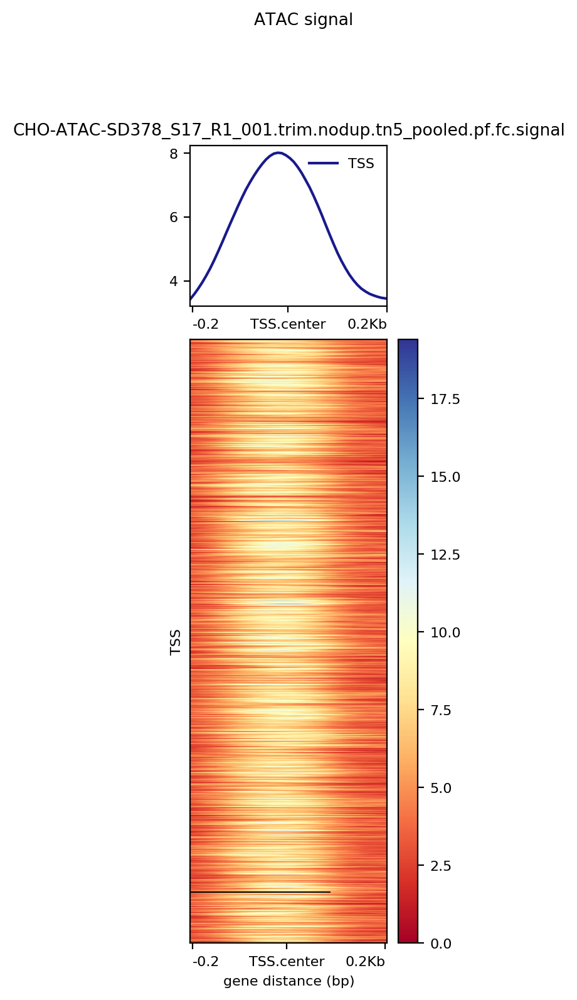

computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_promoters_noDiv.bed -a 250 -b 250 -out Results/ATAC_results/CHO/confident_promoters_noDiv --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/CHO/confident_promoters_noDiv     -out Results/ATAC_results/CHO/confident_promoters_noDiv.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


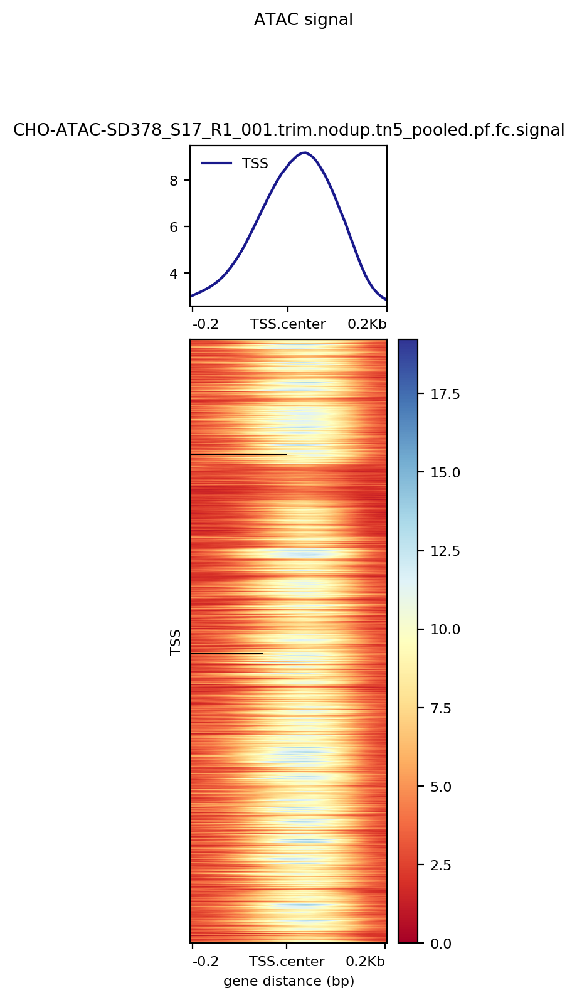

Brain
computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Brain/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Brain/confident_promoters     -out Results/ATAC_results/Brain/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


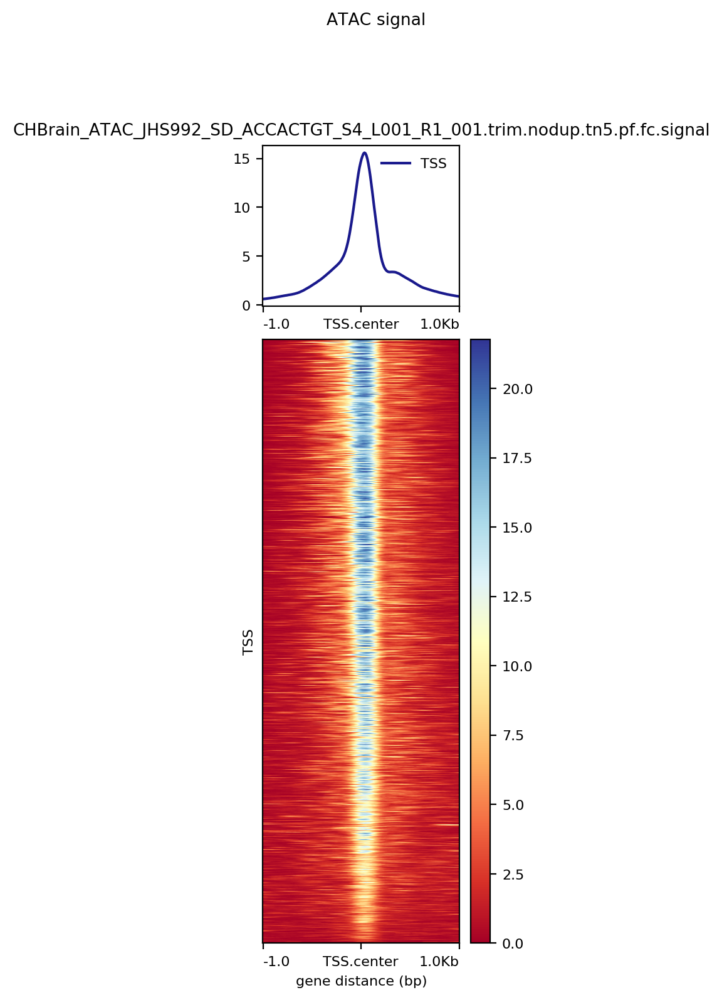

computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/Brain/no_peaks --numberOfProcessors 6 
Skipping ID=asmbl_20945;Parent=gene_7002;gene_id=gene_7002;gene=IGHV3-74;transcript_id=asmbl_20945;cs=4, due to being absent in the computeMatrix output.
plotHeatmap     -m Results/ATAC_results/Brain/no_peaks     -out Results/ATAC_results/Brain/no_peaks.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


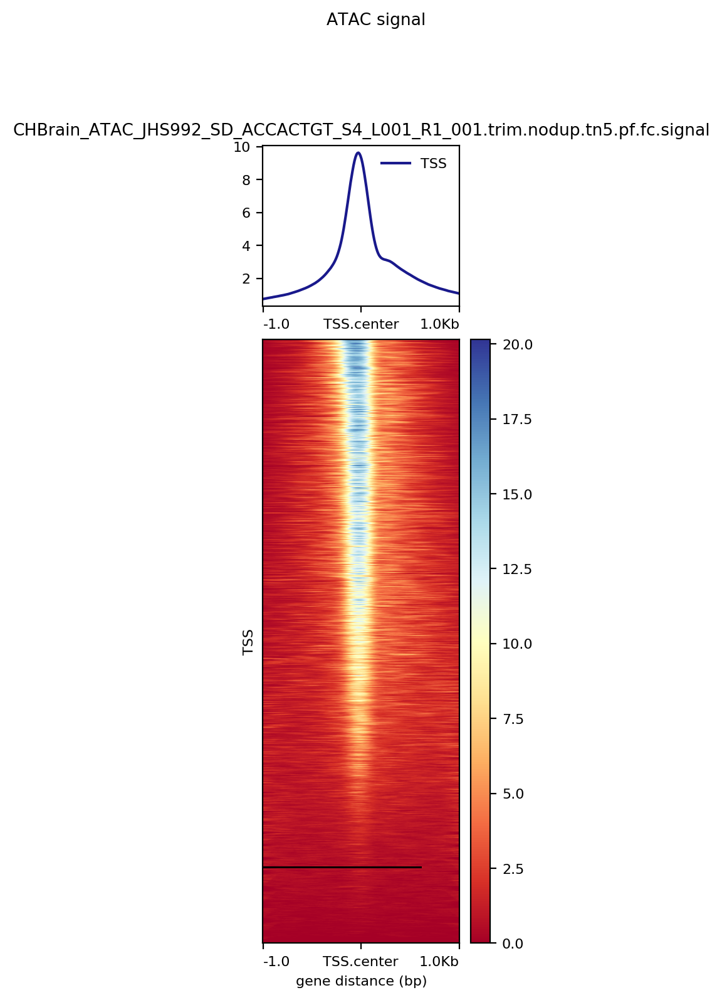

computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/confident_enhancers.bed -a 1000 -b 1000 -out Results/ATAC_results/Brain/confident_enhancers --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Brain/confident_enhancers     -out Results/ATAC_results/Brain/confident_enhancers.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


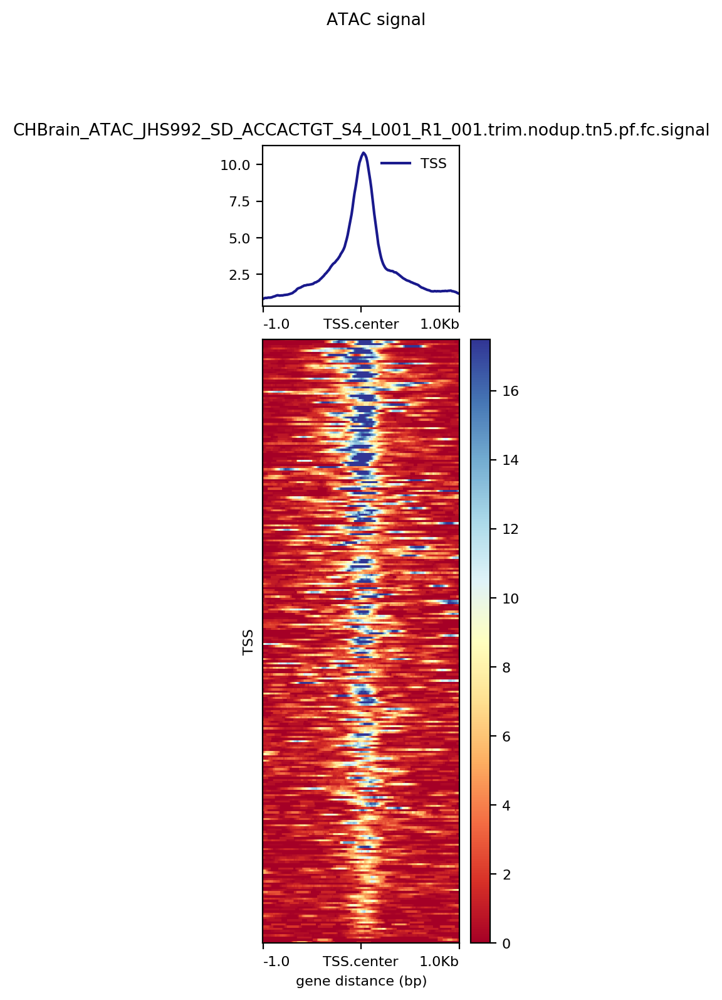

computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/confident_promoters.bed -a 250 -b 250 -out Results/ATAC_results/Brain/confident_promoters_sorted_distance --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Brain/confident_promoters_sorted_distance     -out Results/ATAC_results/Brain/confident_promoters_sorted_distance.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


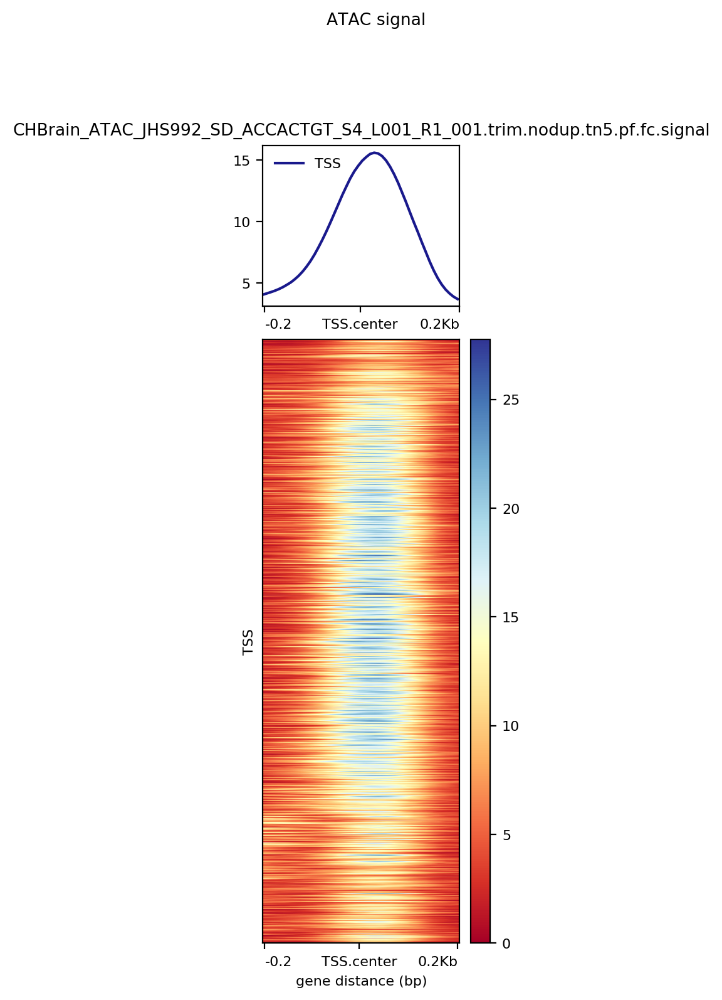

computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/confident_promoters_noDiv_PICR.bed -a 250 -b 250 -out Results/ATAC_results/Brain/confident_promoters_noDiv_PICR --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Brain/confident_promoters_noDiv_PICR     -out Results/ATAC_results/Brain/confident_promoters_noDiv_PICR.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


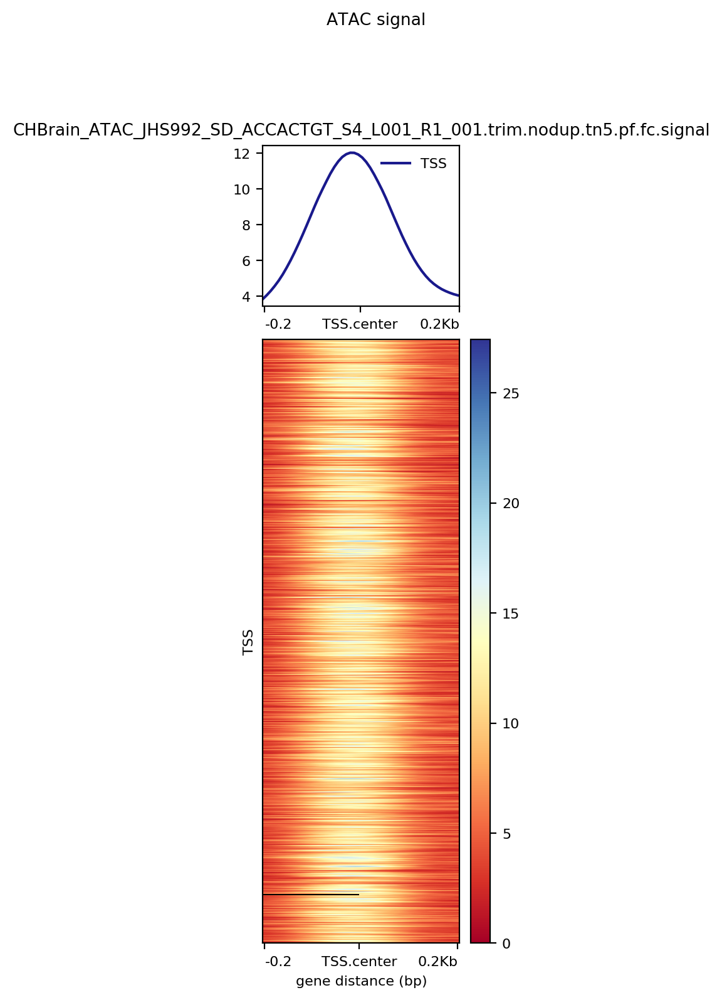

computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/confident_promoters_noDiv.bed -a 250 -b 250 -out Results/ATAC_results/Brain/confident_promoters_noDiv --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Brain/confident_promoters_noDiv     -out Results/ATAC_results/Brain/confident_promoters_noDiv.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


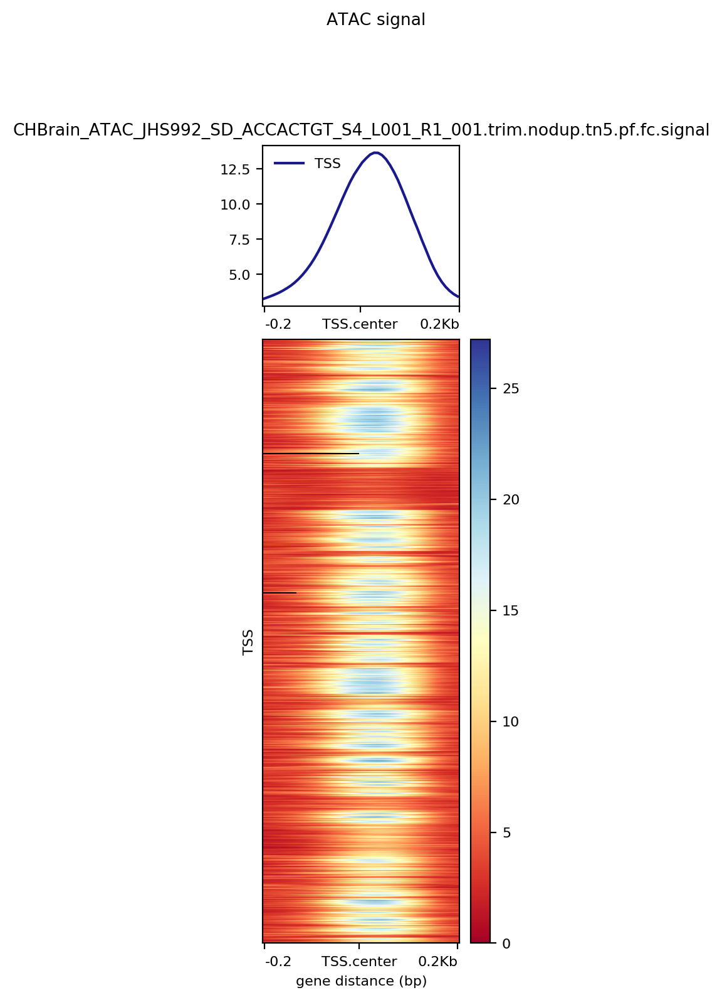

Liver
computeMatrix reference-point -S ../Processed/Liver/ATAC/out/signal/macs2/rep1/CHLiver_ATAC_JHS994_SD_CCGTTTGT_S6_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Liver/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Liver/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Liver/confident_promoters     -out Results/ATAC_results/Liver/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


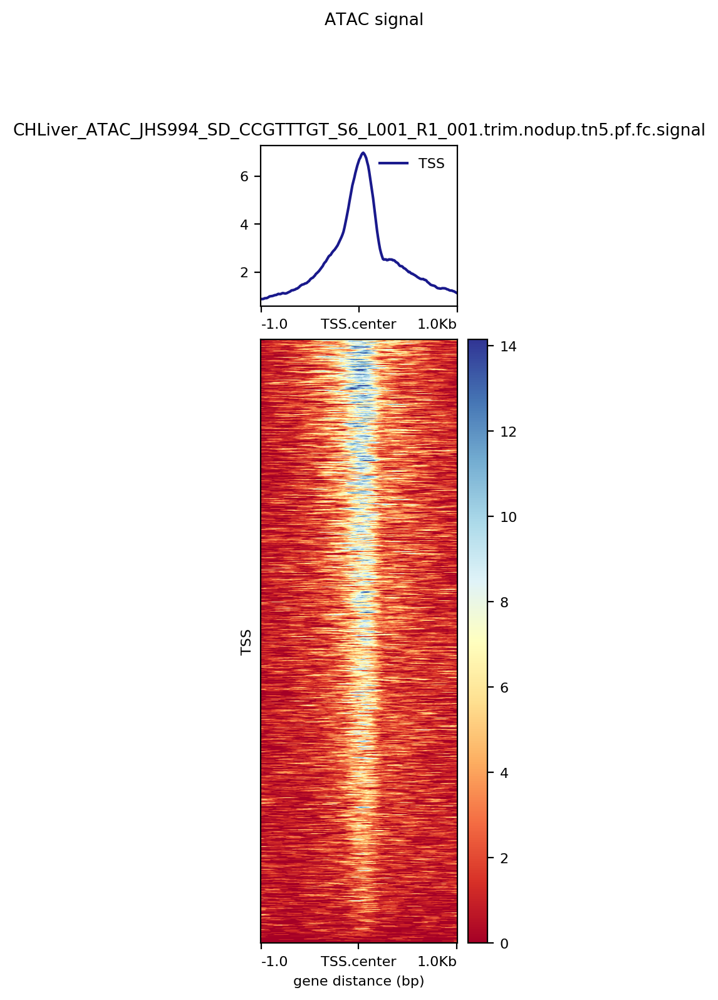

computeMatrix reference-point -S ../Processed/Liver/ATAC/out/signal/macs2/rep1/CHLiver_ATAC_JHS994_SD_CCGTTTGT_S6_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Liver/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/Liver/no_peaks --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Liver/no_peaks     -out Results/ATAC_results/Liver/no_peaks.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


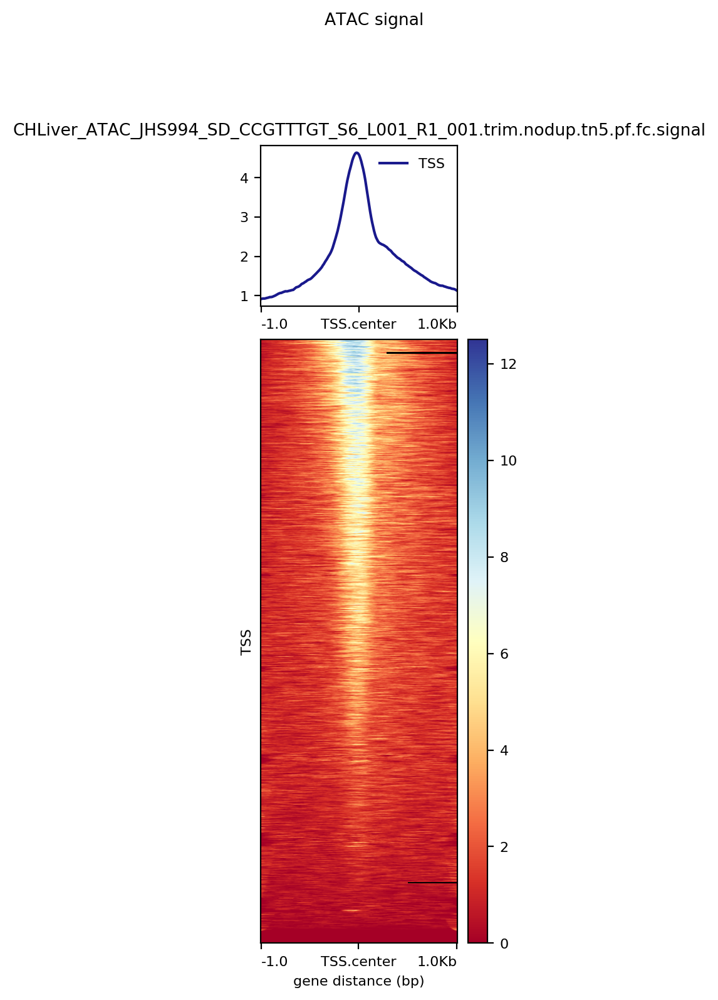

computeMatrix reference-point -S ../Processed/Liver/ATAC/out/signal/macs2/rep1/CHLiver_ATAC_JHS994_SD_CCGTTTGT_S6_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Liver/confident_enhancers.bed -a 1000 -b 1000 -out Results/ATAC_results/Liver/confident_enhancers --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Liver/confident_enhancers     -out Results/ATAC_results/Liver/confident_enhancers.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


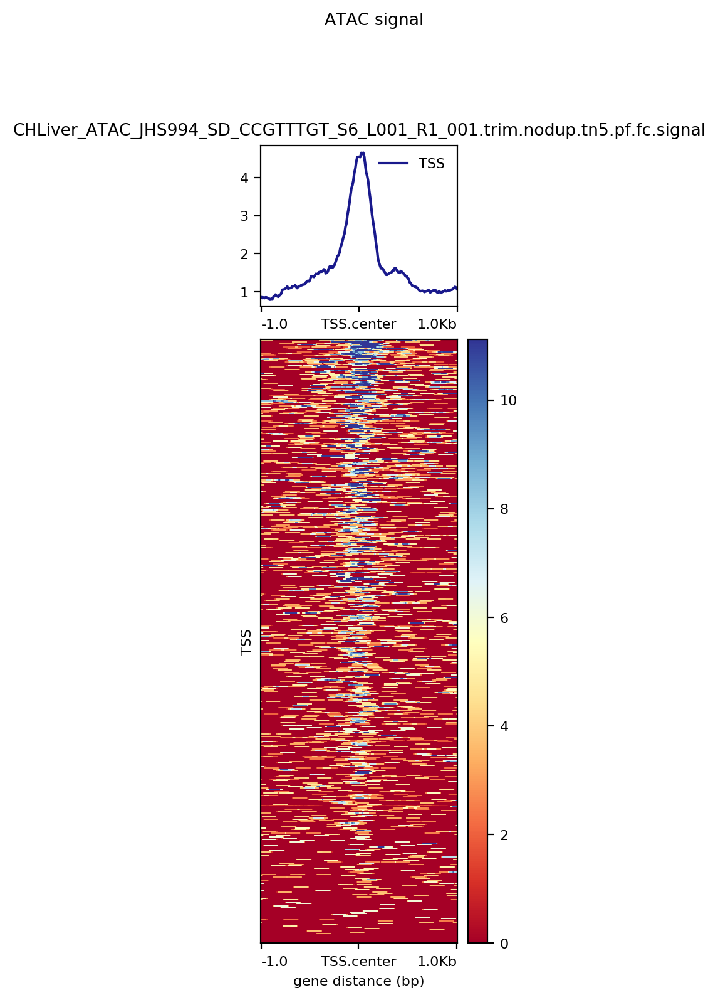

computeMatrix reference-point -S ../Processed/Liver/ATAC/out/signal/macs2/rep1/CHLiver_ATAC_JHS994_SD_CCGTTTGT_S6_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Liver/confident_promoters.bed -a 250 -b 250 -out Results/ATAC_results/Liver/confident_promoters_sorted_distance --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Liver/confident_promoters_sorted_distance     -out Results/ATAC_results/Liver/confident_promoters_sorted_distance.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


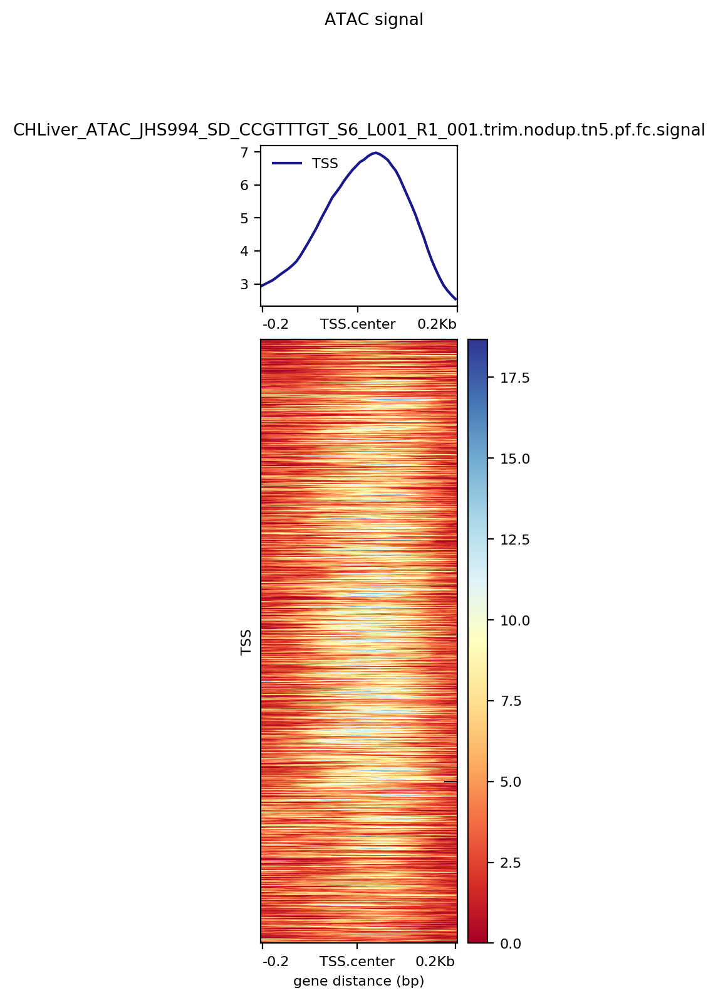

computeMatrix reference-point -S ../Processed/Liver/ATAC/out/signal/macs2/rep1/CHLiver_ATAC_JHS994_SD_CCGTTTGT_S6_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Liver/confident_promoters_noDiv_PICR.bed -a 250 -b 250 -out Results/ATAC_results/Liver/confident_promoters_noDiv_PICR --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Liver/confident_promoters_noDiv_PICR     -out Results/ATAC_results/Liver/confident_promoters_noDiv_PICR.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


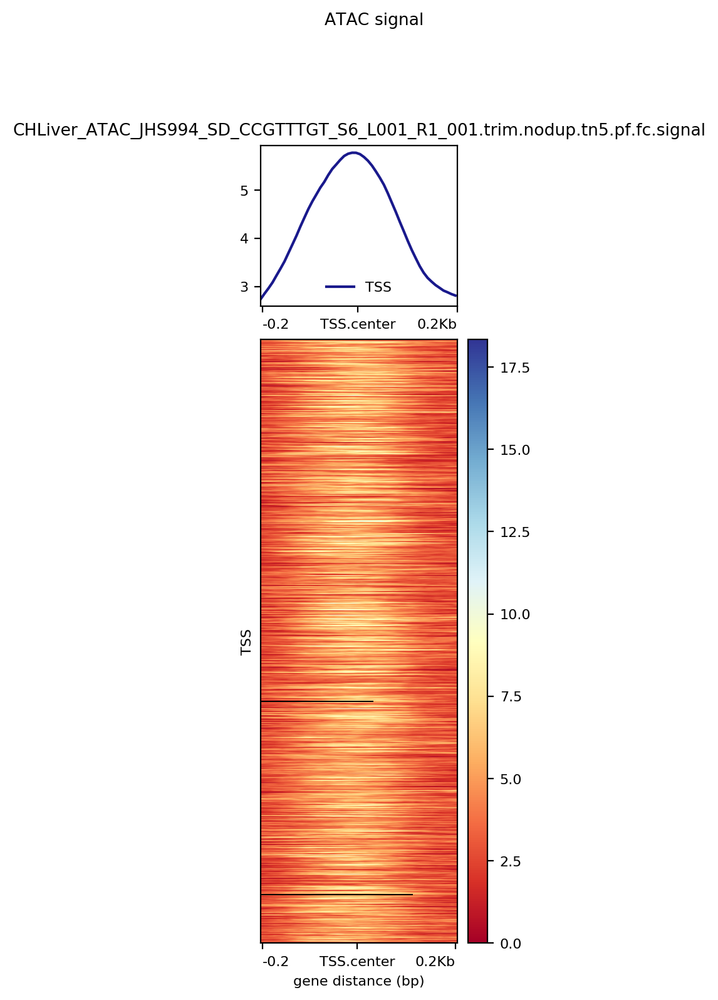

computeMatrix reference-point -S ../Processed/Liver/ATAC/out/signal/macs2/rep1/CHLiver_ATAC_JHS994_SD_CCGTTTGT_S6_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Liver/confident_promoters_noDiv.bed -a 250 -b 250 -out Results/ATAC_results/Liver/confident_promoters_noDiv --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Liver/confident_promoters_noDiv     -out Results/ATAC_results/Liver/confident_promoters_noDiv.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


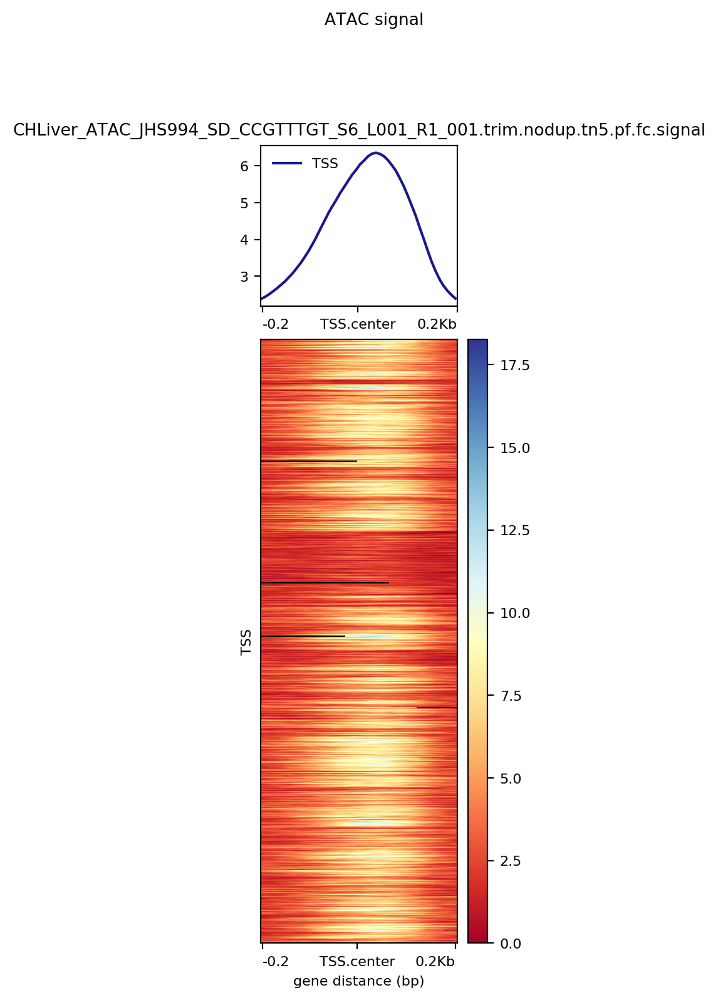

Lung
computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Lung/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Lung/confident_promoters     -out Results/ATAC_results/Lung/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


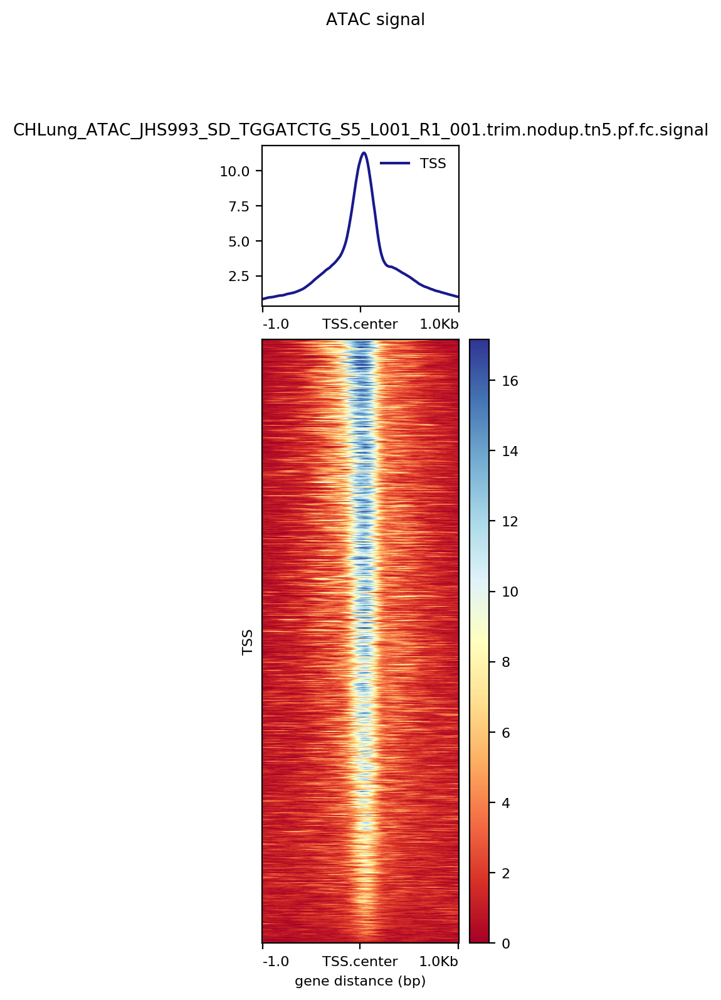

computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/Lung/no_peaks --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Lung/no_peaks     -out Results/ATAC_results/Lung/no_peaks.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



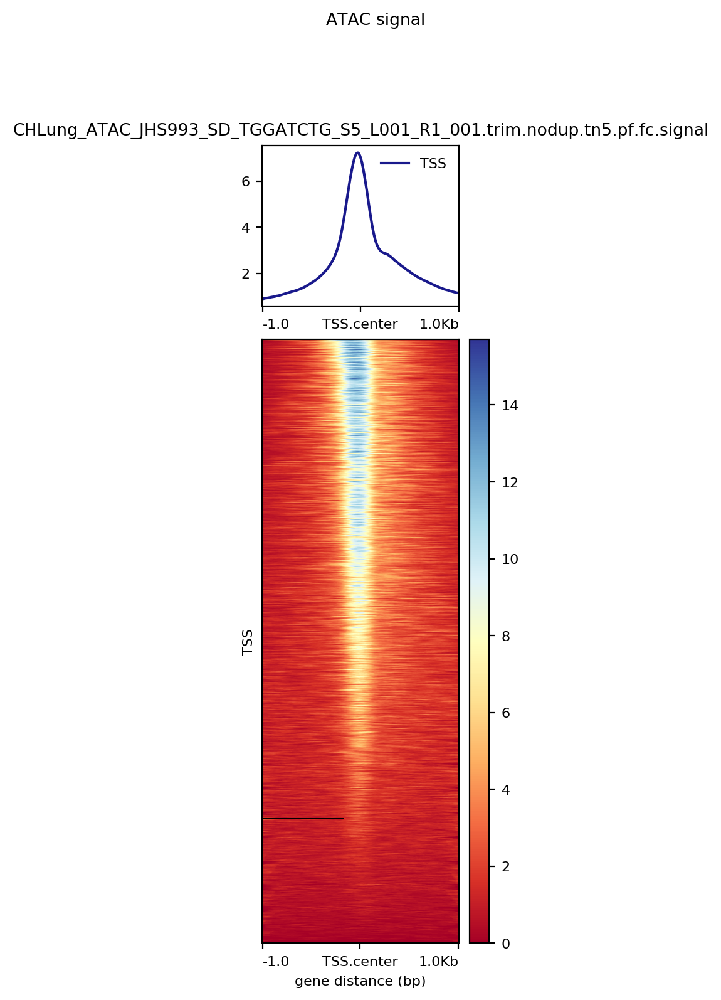

computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/confident_enhancers.bed -a 1000 -b 1000 -out Results/ATAC_results/Lung/confident_enhancers --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Lung/confident_enhancers     -out Results/ATAC_results/Lung/confident_enhancers.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


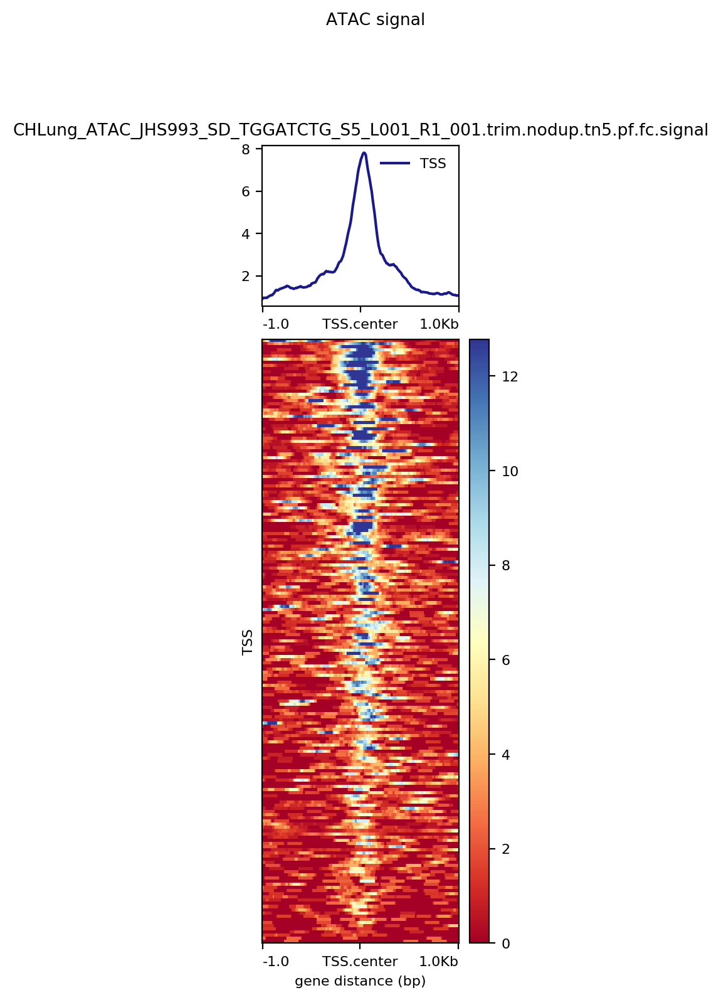

computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/confident_promoters.bed -a 250 -b 250 -out Results/ATAC_results/Lung/confident_promoters_sorted_distance --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Lung/confident_promoters_sorted_distance     -out Results/ATAC_results/Lung/confident_promoters_sorted_distance.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


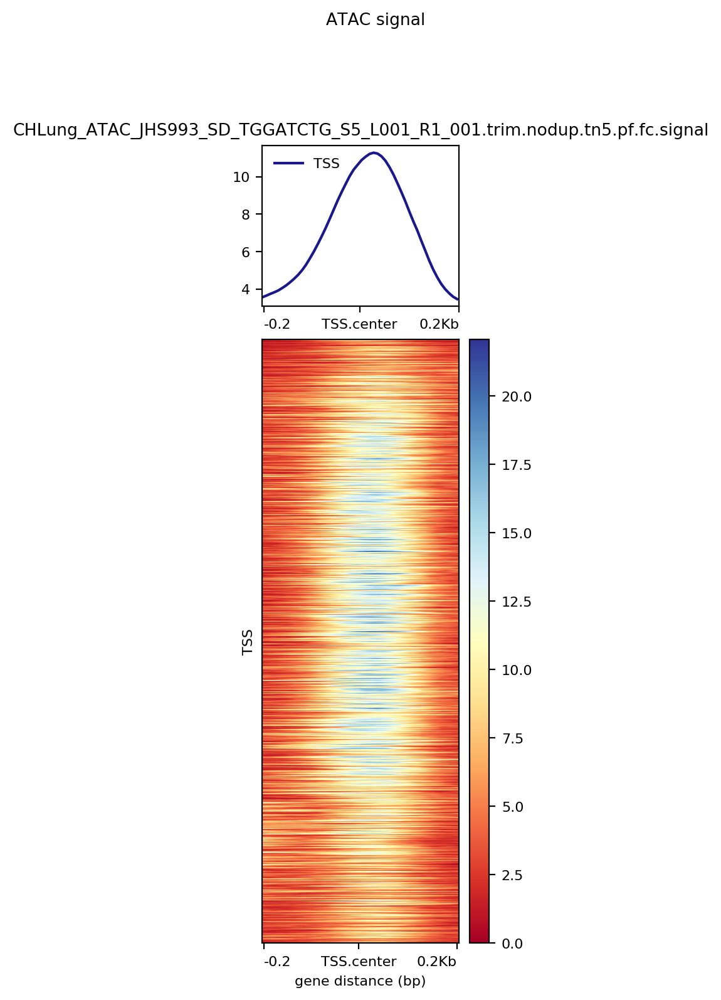

computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/confident_promoters_noDiv_PICR.bed -a 250 -b 250 -out Results/ATAC_results/Lung/confident_promoters_noDiv_PICR --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Lung/confident_promoters_noDiv_PICR     -out Results/ATAC_results/Lung/confident_promoters_noDiv_PICR.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


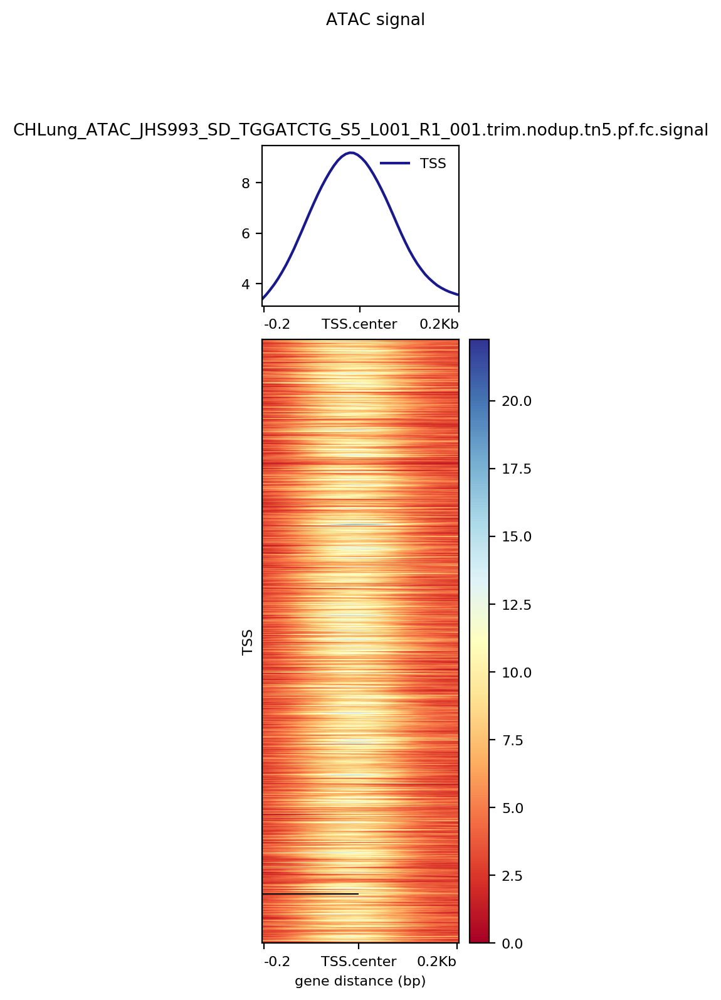

computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/confident_promoters_noDiv.bed -a 250 -b 250 -out Results/ATAC_results/Lung/confident_promoters_noDiv --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Lung/confident_promoters_noDiv     -out Results/ATAC_results/Lung/confident_promoters_noDiv.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


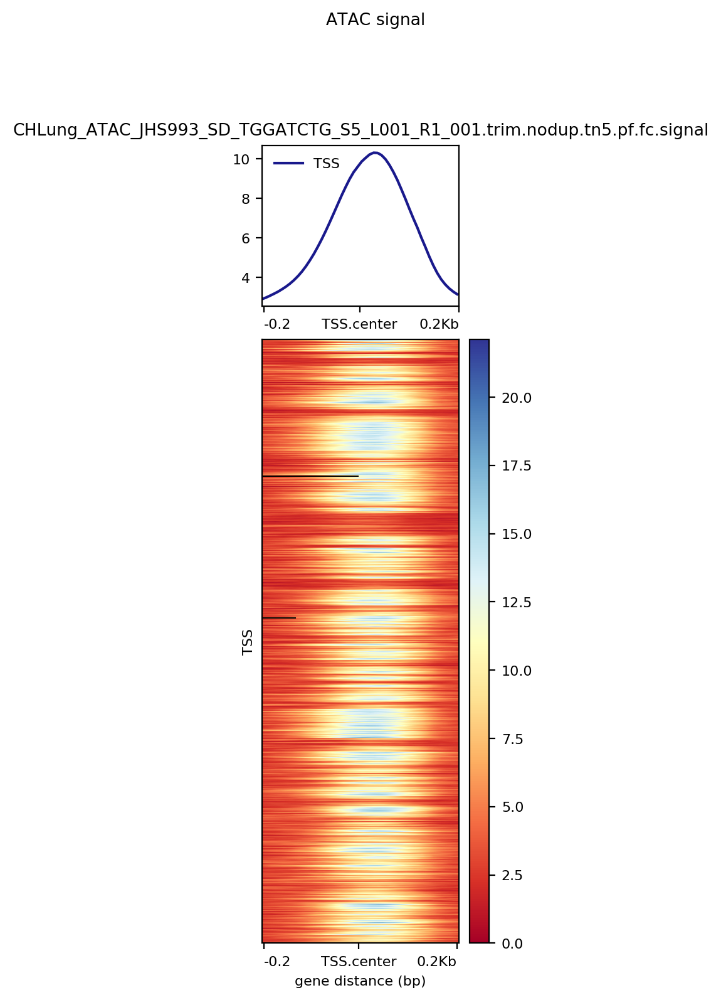

Kidney
computeMatrix reference-point -S ../Processed/Kidney/ATAC/out/signal/macs2/rep1/CHKidney_ATAC_JHS991_SD_CGAGGCTG_S3_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Kidney/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Kidney/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Kidney/confident_promoters     -out Results/ATAC_results/Kidney/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


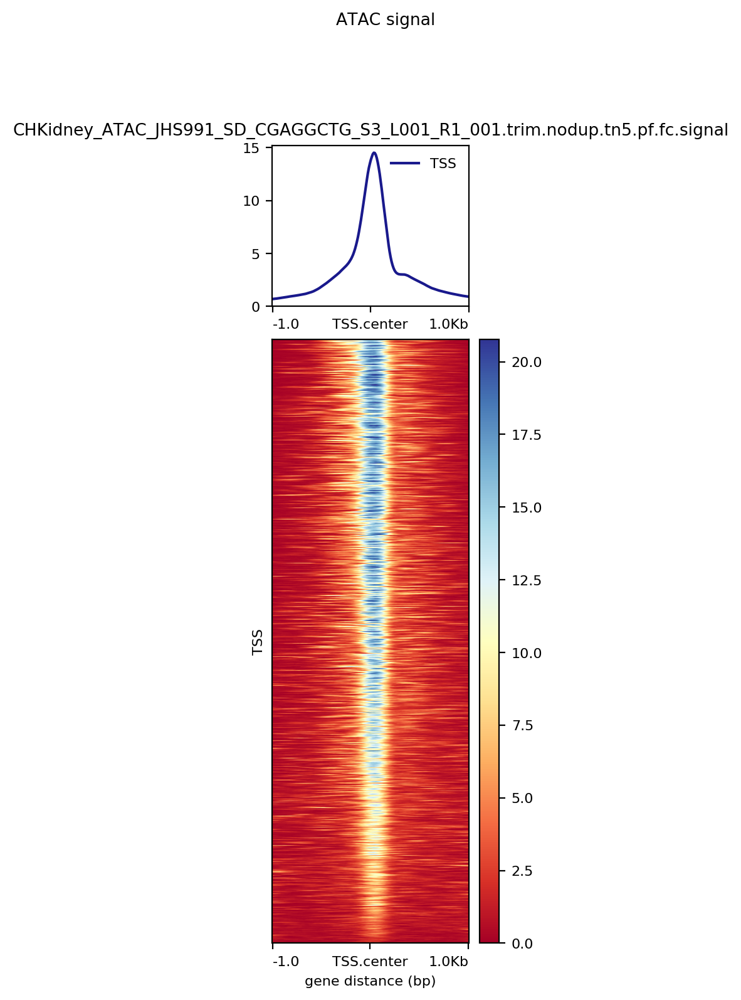

computeMatrix reference-point -S ../Processed/Kidney/ATAC/out/signal/macs2/rep1/CHKidney_ATAC_JHS991_SD_CGAGGCTG_S3_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Kidney/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/Kidney/no_peaks --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Kidney/no_peaks     -out Results/ATAC_results/Kidney/no_peaks.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


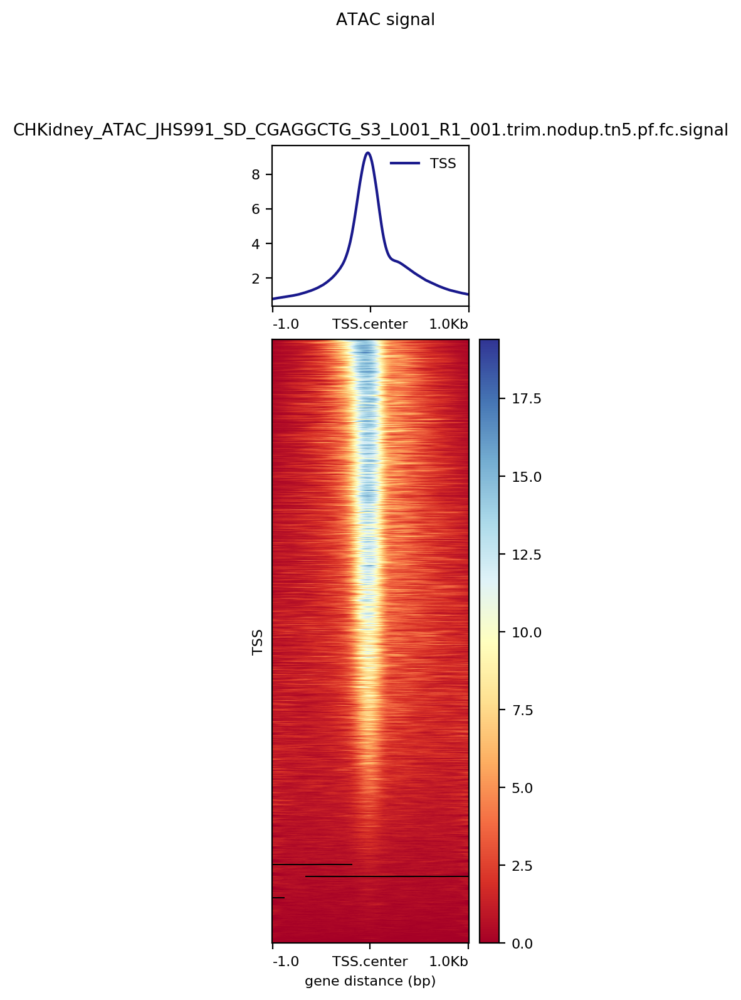

computeMatrix reference-point -S ../Processed/Kidney/ATAC/out/signal/macs2/rep1/CHKidney_ATAC_JHS991_SD_CGAGGCTG_S3_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Kidney/confident_enhancers.bed -a 1000 -b 1000 -out Results/ATAC_results/Kidney/confident_enhancers --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Kidney/confident_enhancers     -out Results/ATAC_results/Kidney/confident_enhancers.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


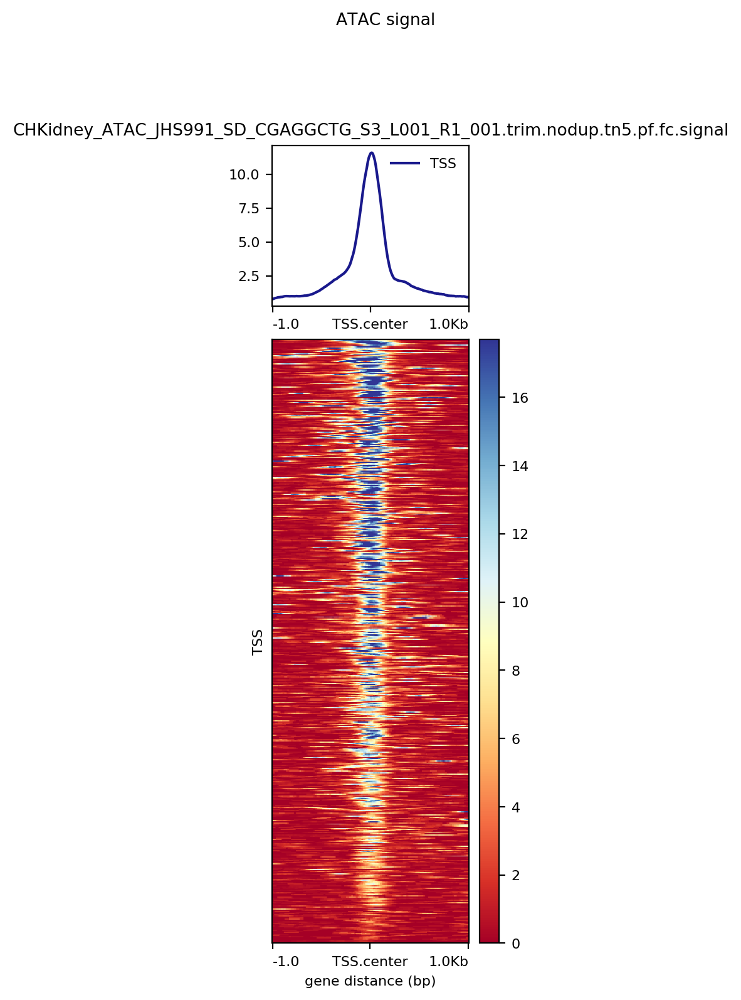

computeMatrix reference-point -S ../Processed/Kidney/ATAC/out/signal/macs2/rep1/CHKidney_ATAC_JHS991_SD_CGAGGCTG_S3_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Kidney/confident_promoters.bed -a 250 -b 250 -out Results/ATAC_results/Kidney/confident_promoters_sorted_distance --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Kidney/confident_promoters_sorted_distance     -out Results/ATAC_results/Kidney/confident_promoters_sorted_distance.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


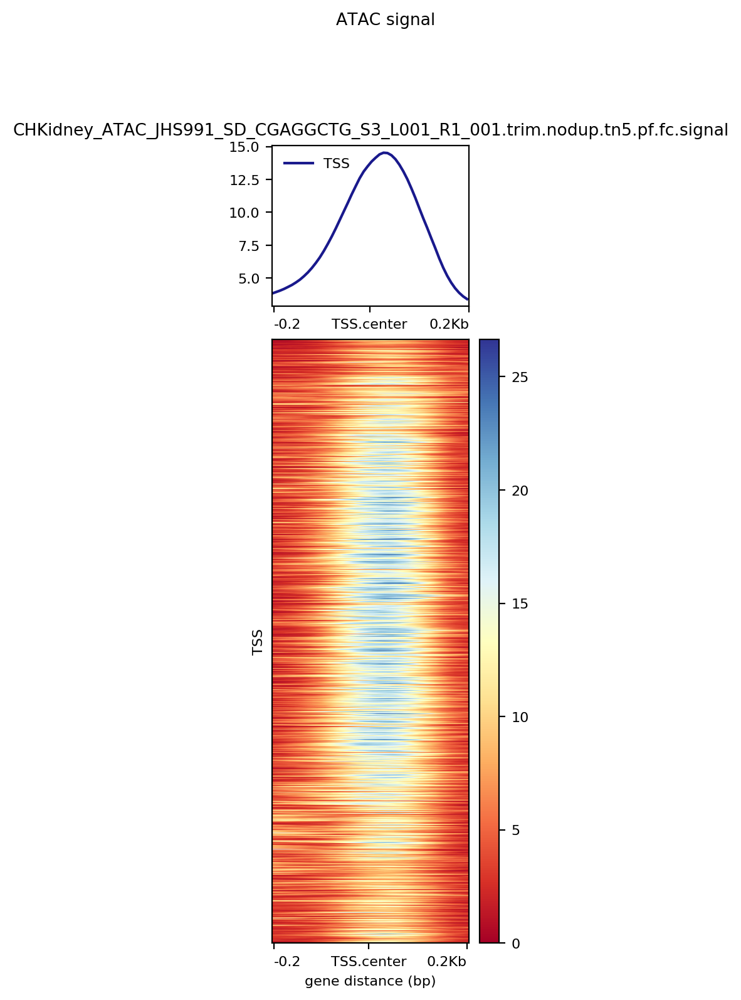

computeMatrix reference-point -S ../Processed/Kidney/ATAC/out/signal/macs2/rep1/CHKidney_ATAC_JHS991_SD_CGAGGCTG_S3_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Kidney/confident_promoters_noDiv_PICR.bed -a 250 -b 250 -out Results/ATAC_results/Kidney/confident_promoters_noDiv_PICR --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Kidney/confident_promoters_noDiv_PICR     -out Results/ATAC_results/Kidney/confident_promoters_noDiv_PICR.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


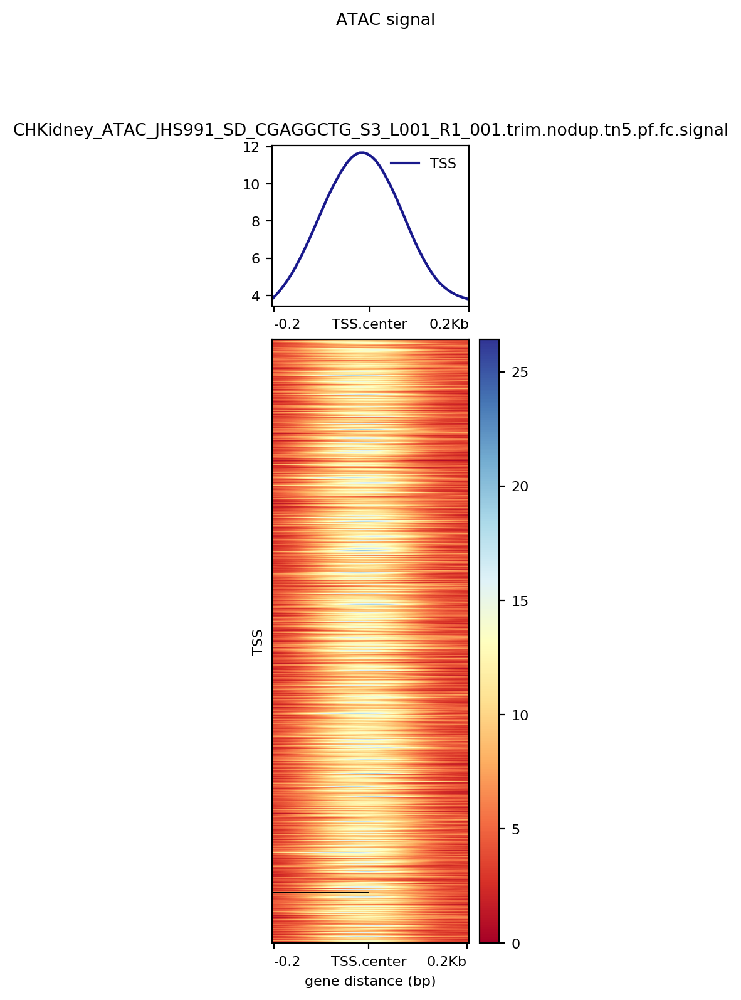

computeMatrix reference-point -S ../Processed/Kidney/ATAC/out/signal/macs2/rep1/CHKidney_ATAC_JHS991_SD_CGAGGCTG_S3_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Kidney/confident_promoters_noDiv.bed -a 250 -b 250 -out Results/ATAC_results/Kidney/confident_promoters_noDiv --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Kidney/confident_promoters_noDiv     -out Results/ATAC_results/Kidney/confident_promoters_noDiv.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


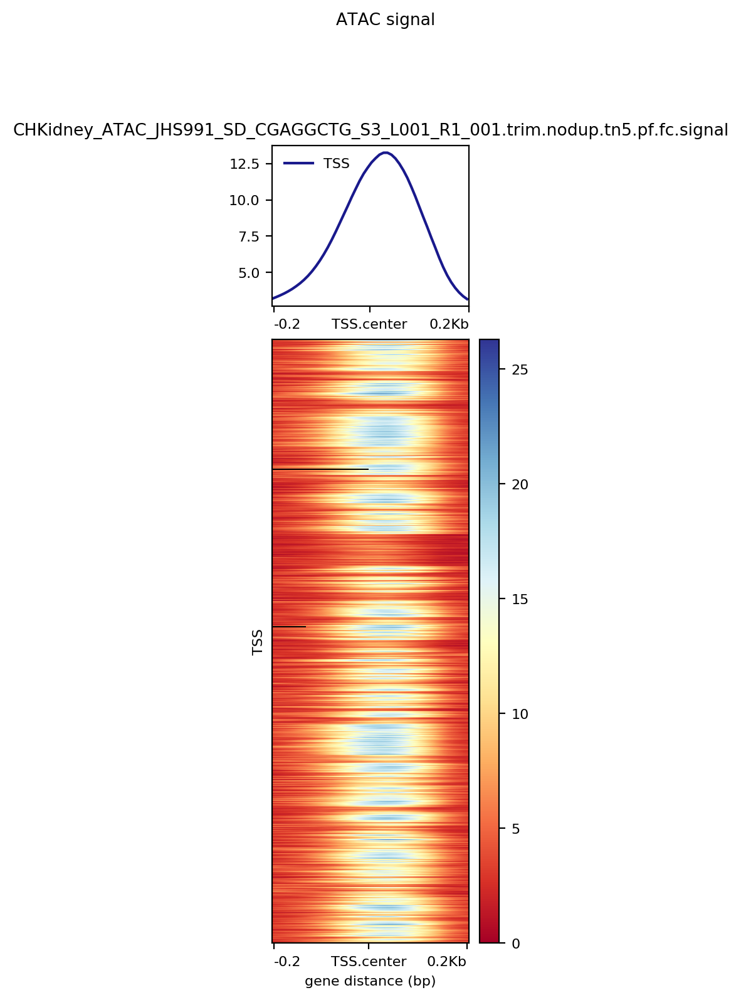

Spleen
computeMatrix reference-point -S ../Processed/Spleen/ATAC/out/signal/macs2/rep1/CHSpleenBlood_ATAC_JHS995_SD_TGCTGGGT_S7_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Spleen/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Spleen/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Spleen/confident_promoters     -out Results/ATAC_results/Spleen/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


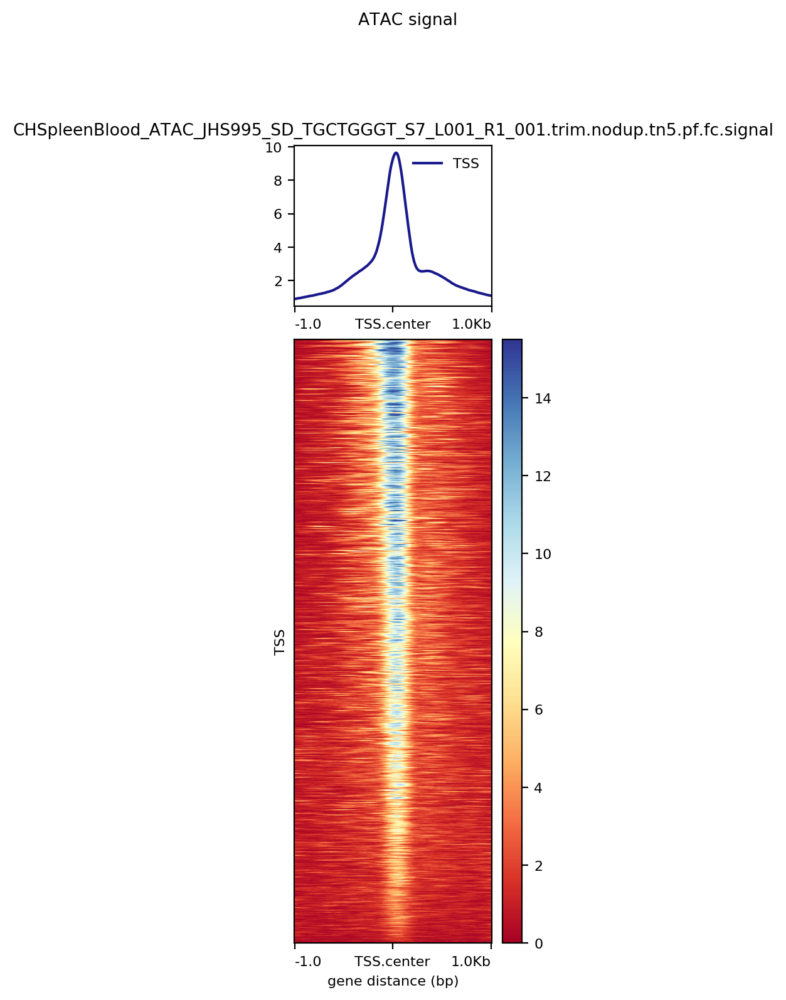

computeMatrix reference-point -S ../Processed/Spleen/ATAC/out/signal/macs2/rep1/CHSpleenBlood_ATAC_JHS995_SD_TGCTGGGT_S7_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Spleen/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/Spleen/no_peaks --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Spleen/no_peaks     -out Results/ATAC_results/Spleen/no_peaks.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


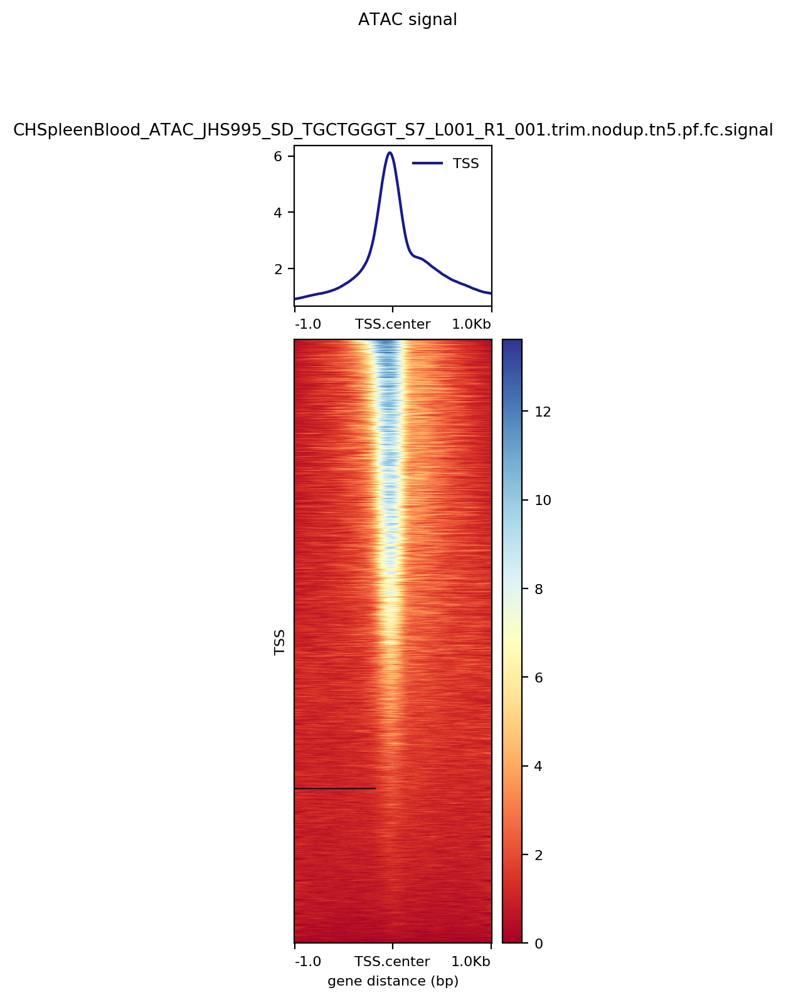

computeMatrix reference-point -S ../Processed/Spleen/ATAC/out/signal/macs2/rep1/CHSpleenBlood_ATAC_JHS995_SD_TGCTGGGT_S7_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Spleen/confident_enhancers.bed -a 1000 -b 1000 -out Results/ATAC_results/Spleen/confident_enhancers --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/Spleen/confident_enhancers     -out Results/ATAC_results/Spleen/confident_enhancers.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


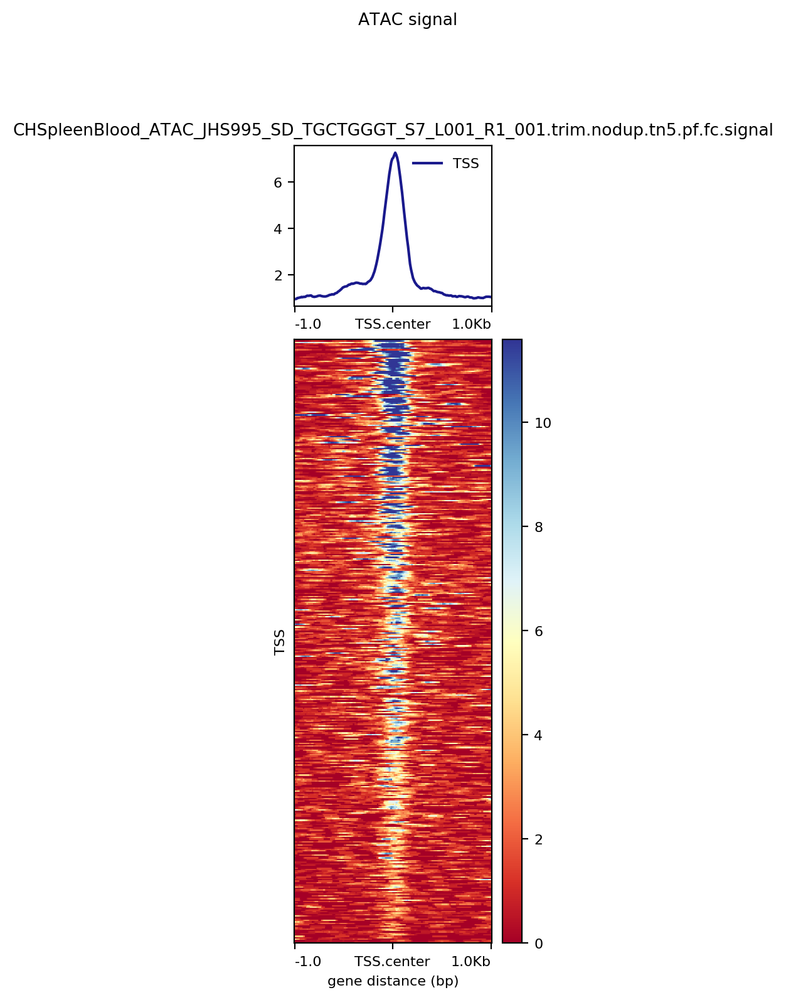

computeMatrix reference-point -S ../Processed/Spleen/ATAC/out/signal/macs2/rep1/CHSpleenBlood_ATAC_JHS995_SD_TGCTGGGT_S7_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Spleen/confident_promoters.bed -a 250 -b 250 -out Results/ATAC_results/Spleen/confident_promoters_sorted_distance --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Spleen/confident_promoters_sorted_distance     -out Results/ATAC_results/Spleen/confident_promoters_sorted_distance.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


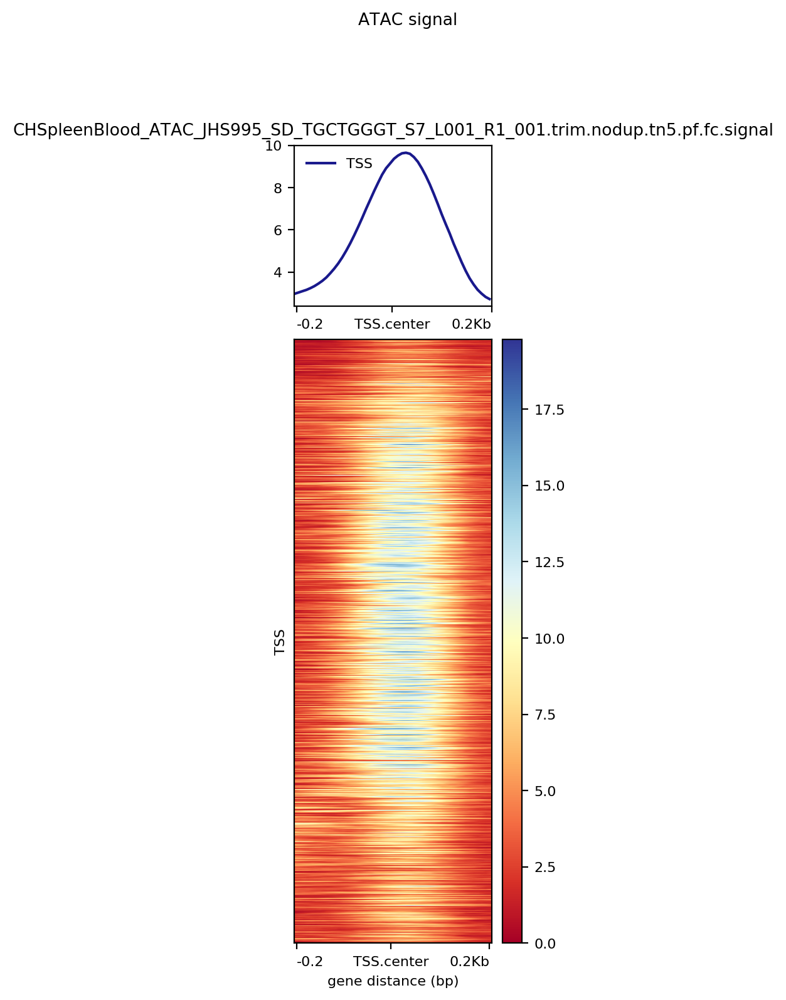

computeMatrix reference-point -S ../Processed/Spleen/ATAC/out/signal/macs2/rep1/CHSpleenBlood_ATAC_JHS995_SD_TGCTGGGT_S7_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Spleen/confident_promoters_noDiv_PICR.bed -a 250 -b 250 -out Results/ATAC_results/Spleen/confident_promoters_noDiv_PICR --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Spleen/confident_promoters_noDiv_PICR     -out Results/ATAC_results/Spleen/confident_promoters_noDiv_PICR.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


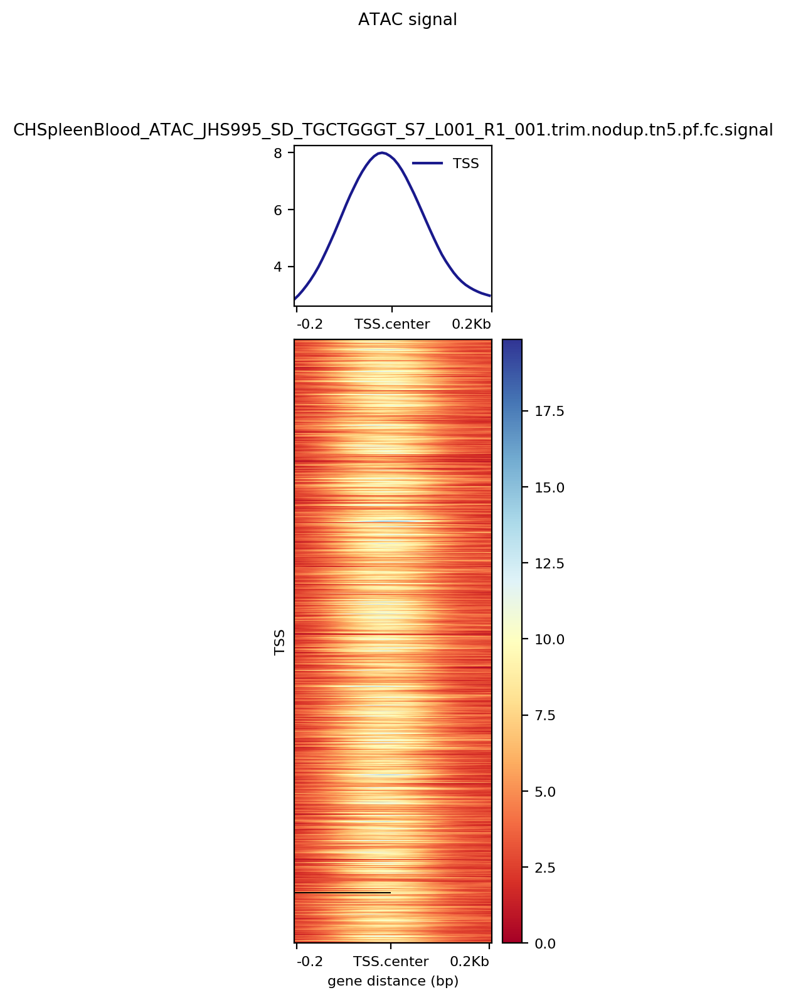

computeMatrix reference-point -S ../Processed/Spleen/ATAC/out/signal/macs2/rep1/CHSpleenBlood_ATAC_JHS995_SD_TGCTGGGT_S7_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Spleen/confident_promoters_noDiv.bed -a 250 -b 250 -out Results/ATAC_results/Spleen/confident_promoters_noDiv --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Spleen/confident_promoters_noDiv     -out Results/ATAC_results/Spleen/confident_promoters_noDiv.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


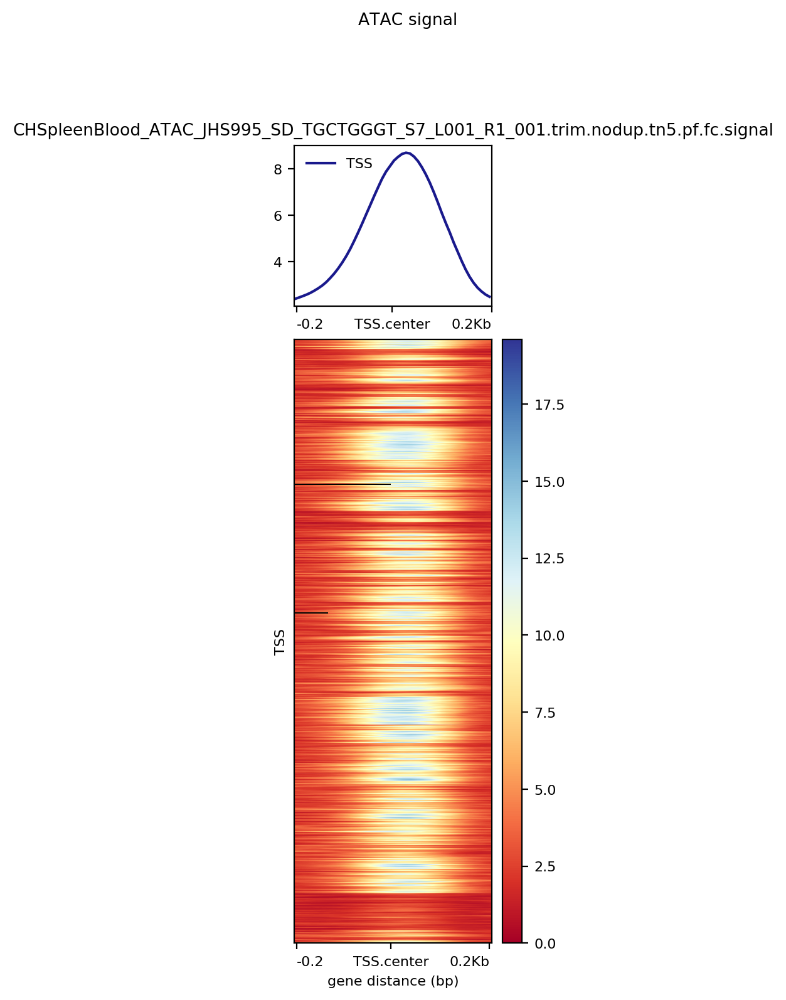

BMDMwt
computeMatrix reference-point -S ../Processed/BMDMwt/ATAC/out/signal/macs2/pooled_rep/CHBMDMVehic2_ATAC_JHS999_SD_TGGTCACA_S10_L001_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/BMDMwt/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/BMDMwt/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/BMDMwt/confident_promoters     -out Results/ATAC_results/BMDMwt/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' 


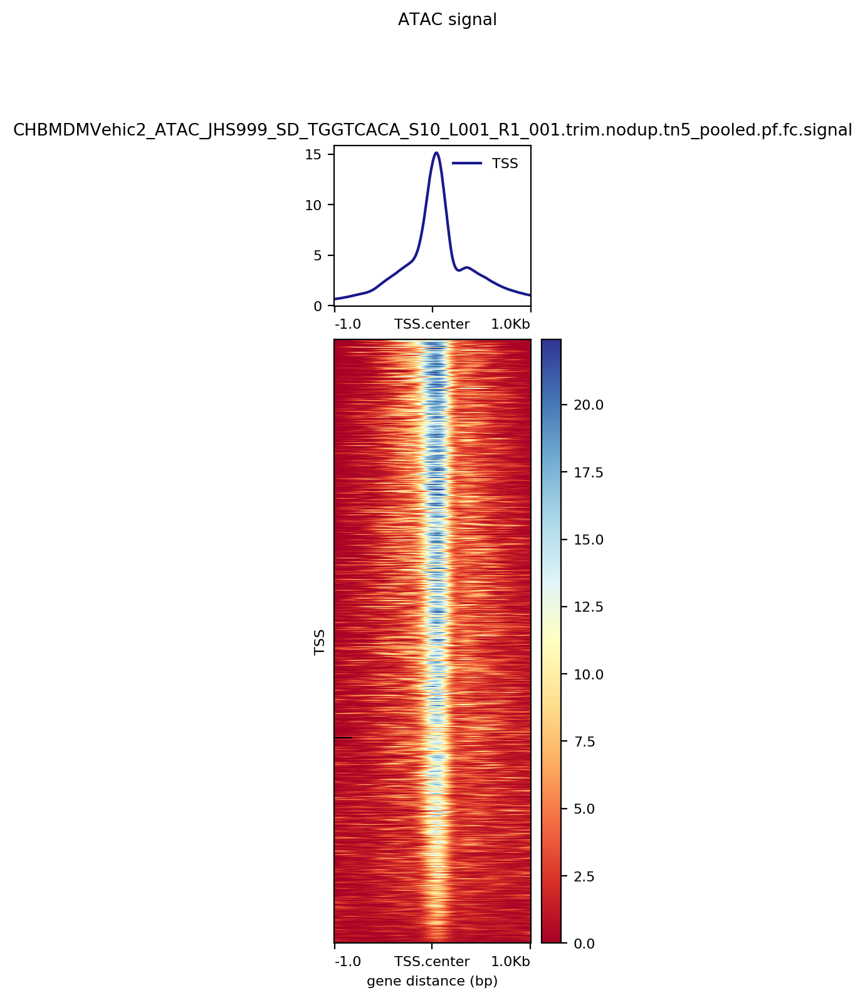

computeMatrix reference-point -S ../Processed/BMDMwt/ATAC/out/signal/macs2/pooled_rep/CHBMDMVehic2_ATAC_JHS999_SD_TGGTCACA_S10_L001_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/BMDMwt/no_peaks.bed -a 1000 -b 1000 -out Results/ATAC_results/BMDMwt/no_peaks --numberOfProcessors 6 


In [ ]:
#t = 'CHO'
for t in tissues_with_atac:
    print(t)
    if os.path.exists('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/'):
        bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/*.fc.signal.bigwig')[0]
    else:
        bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/rep1/*.fc.signal.bigwig')[0]


    curr_in = (os.path.join('Results/peak_groups/', t))
    curr_out = (os.path.join('Results/ATAC_results/', t))
    if not os.path.exists(curr_out):
        os.mkdir(curr_out)

    tss_bed = os.path.join(curr_in, 'confident_promoters.bed')
    outfile = os.path.join(curr_out, 'confident_promoters')
    a = run_heatmap(tss_bed, bigwig, outfile, dist=1000, numProc=6, dispImage=True)
    display(a)

    tss_bed = os.path.join(curr_in, 'no_peaks.bed')
    outfile = os.path.join(curr_out, 'no_peaks')
    b = run_heatmap(tss_bed, bigwig, outfile, dist=1000, numProc=6, dispImage=True)
    display(b)

    tss_bed = os.path.join(curr_in, 'confident_enhancers.bed')
    outfile = os.path.join(curr_out, 'confident_enhancers')
    c = run_heatmap(tss_bed, bigwig, outfile, dist=1000, numProc=6, dispImage=True)
    display(c)


    tss_bed = os.path.join(curr_in, 'confident_promoters.bed')
    outfile = os.path.join(curr_out, 'confident_promoters_sorted_distance')
    d = run_heatmap(
        tss_bed,
        bigwig,
        outfile,
        dist=250,
        numProc=6,
        dispImage=True,
        computeMat_args='--sortRegions keep',
        plotHeat_args='--sortRegions keep')
    display(d)


    tss_bed = os.path.join(curr_in, 'confident_promoters_noDiv_PICR.bed')
    outfile = os.path.join(curr_out, 'confident_promoters_noDiv_PICR')
    e = run_heatmap(
        tss_bed,
        bigwig,
        outfile,
        dist=250,
        numProc=6,
        dispImage=True,
        computeMat_args='--sortRegions keep',
        plotHeat_args='--sortRegions keep')
    display(e)

    tss_bed = os.path.join(curr_in, 'confident_promoters_noDiv.bed')
    outfile = os.path.join(curr_out, 'confident_promoters_noDiv')
    f = run_heatmap(
        tss_bed,
        bigwig,
        outfile,
        dist=250,
        numProc=6,
        dispImage=True,
        computeMat_args='--sortRegions keep',
        plotHeat_args='--sortRegions keep')
    display(f)


In [ ]:
t = 'CHO'

print(t)
if os.path.exists('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/'):
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/*.fc.signal.bigwig')[0]
else:
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/rep1/*.fc.signal.bigwig')[0]


curr_in = (os.path.join('Results/peak_groups/', t))
curr_out = (os.path.join('Results/ATAC_results/', t))
if not os.path.exists(curr_out):
    os.mkdir(curr_out)

tss_bed = os.path.join(curr_in, 'confident_promoters.bed')
outfile = os.path.join(curr_out, 'confident_promoters')
a = run_heatmap(tss_bed, bigwig, outfile, dist=1000, numProc=6, dispImage=True,plotHeat_args=' --dpi 300 ')
display(a)

CHO
computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/CHO/confident_promoters --numberOfProcessors 6 
plotHeatmap     -m Results/ATAC_results/CHO/confident_promoters     -out Results/ATAC_results/CHO/confident_promoters.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal'  --dpi 300 


## Looking at few examples of of promoters sorted by their distance to referecence annotation, here from -1kb to +1kb. You can see faint ATAC signal as the experimental gets further downstream from the reference

Brain
computeMatrix reference-point -S ../Processed/Brain/ATAC/out/signal/macs2/rep1/CHBrain_ATAC_JHS992_SD_ACCACTGT_S4_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Brain/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Brain/confident_promoters_sorted_distance_1000 --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Brain/confident_promoters_sorted_distance_1000     -out Results/ATAC_results/Brain/confident_promoters_sorted_distance_1000.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


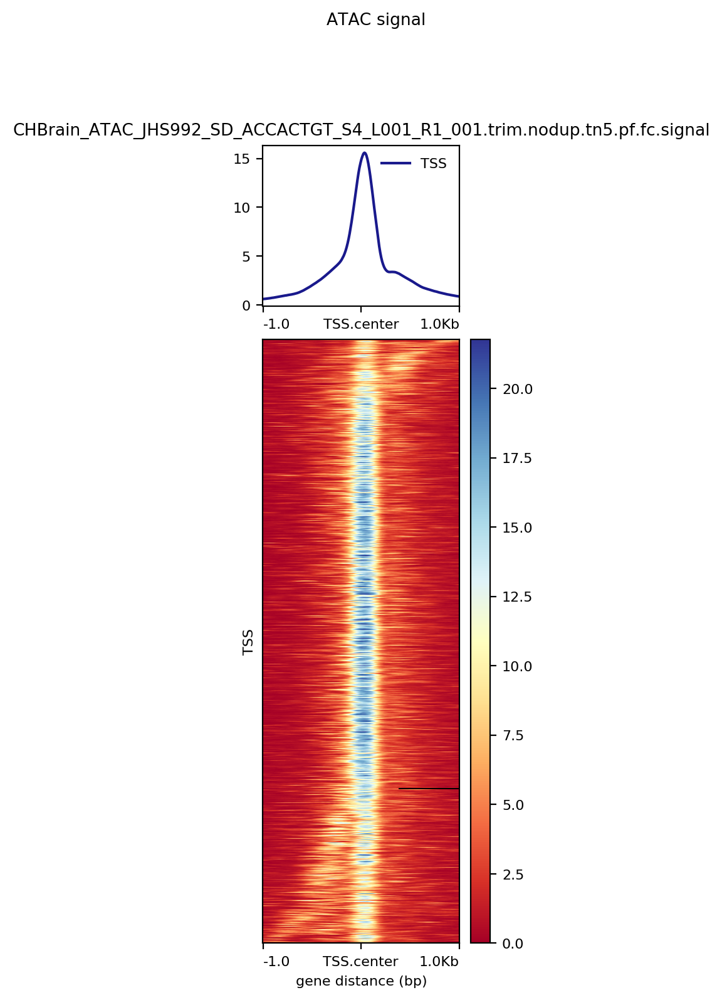

In [24]:
t = 'Brain'
print(t)
if os.path.exists('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/'):
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/*.fc.signal.bigwig')[0]
else:
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/rep1/*.fc.signal.bigwig')[0]


curr_in = (os.path.join('Results/peak_groups/', t))
curr_out = (os.path.join('Results/ATAC_results/', t))
if not os.path.exists(curr_out):
    os.mkdir(curr_out)


tss_bed = os.path.join(curr_in, 'confident_promoters.bed')
outfile = os.path.join(curr_out, 'confident_promoters_sorted_distance_1000')
d = run_heatmap(
    tss_bed,
    bigwig,
    outfile,
    dist=1000,
    numProc=6,
    dispImage=True,
    computeMat_args='--sortRegions keep',
    plotHeat_args='--sortRegions keep')
display(d)

CHO
computeMatrix reference-point -S ../Processed/CHO/ATAC/out/signal/macs2/pooled_rep/CHO-ATAC-SD378_S17_R1_001.trim.nodup.tn5_pooled.pf.fc.signal.bigwig -R Results/peak_groups/CHO/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/CHO/confident_promoters_sorted_distance_1000 --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/CHO/confident_promoters_sorted_distance_1000     -out Results/ATAC_results/CHO/confident_promoters_sorted_distance_1000.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


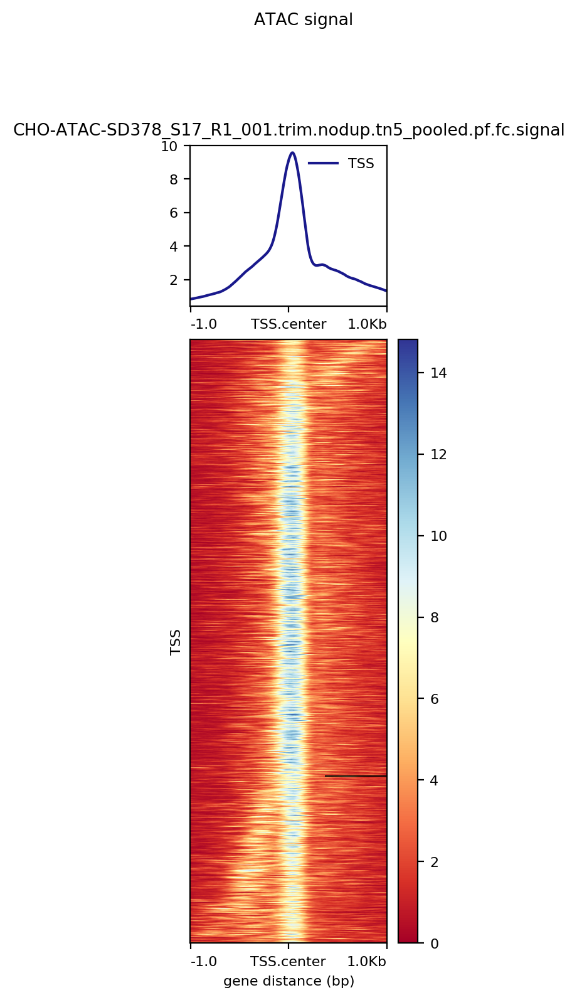

In [25]:
t = 'CHO'
print(t)
if os.path.exists('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/'):
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/*.fc.signal.bigwig')[0]
else:
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/rep1/*.fc.signal.bigwig')[0]


curr_in = (os.path.join('Results/peak_groups/', t))
curr_out = (os.path.join('Results/ATAC_results/', t))
if not os.path.exists(curr_out):
    os.mkdir(curr_out)


tss_bed = os.path.join(curr_in, 'confident_promoters.bed')
outfile = os.path.join(curr_out, 'confident_promoters_sorted_distance_1000')
d = run_heatmap(
    tss_bed,
    bigwig,
    outfile,
    dist=1000,
    numProc=6,
    dispImage=True,
    computeMat_args='--sortRegions keep',
    plotHeat_args='--sortRegions keep')
display(d)

Lung
computeMatrix reference-point -S ../Processed/Lung/ATAC/out/signal/macs2/rep1/CHLung_ATAC_JHS993_SD_TGGATCTG_S5_L001_R1_001.trim.nodup.tn5.pf.fc.signal.bigwig -R Results/peak_groups/Lung/confident_promoters.bed -a 1000 -b 1000 -out Results/ATAC_results/Lung/confident_promoters_sorted_distance_1000 --numberOfProcessors 6 --sortRegions keep
plotHeatmap     -m Results/ATAC_results/Lung/confident_promoters_sorted_distance_1000     -out Results/ATAC_results/Lung/confident_promoters_sorted_distance_1000.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal' --sortRegions keep


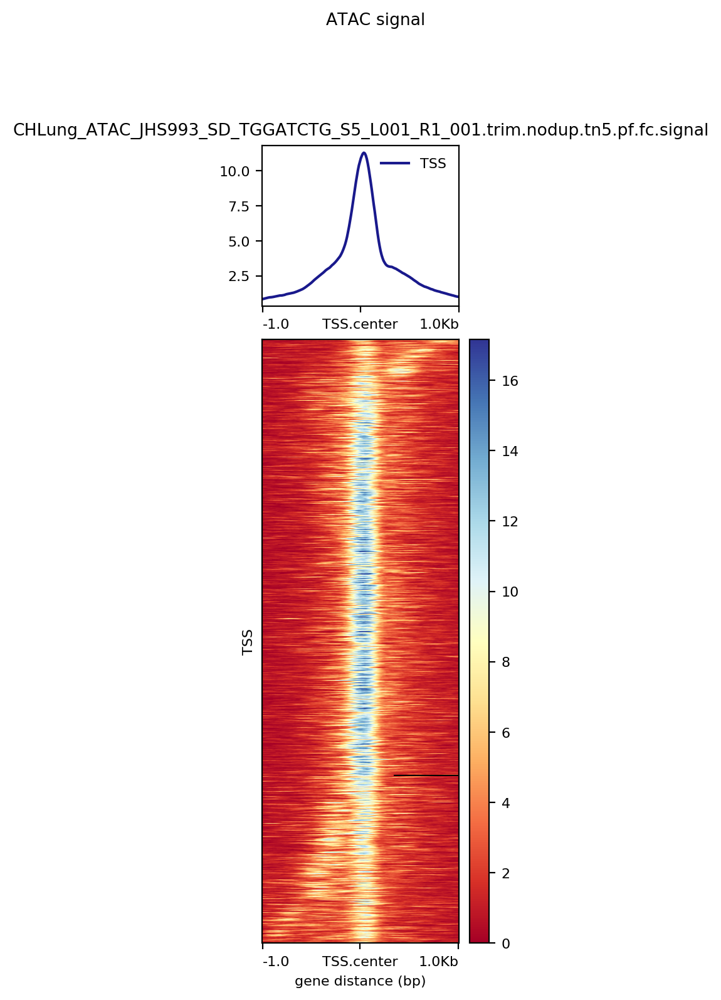

In [26]:
t = 'Lung'
print(t)
if os.path.exists('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/'):
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/pooled_rep/*.fc.signal.bigwig')[0]
else:
    bigwig = glob.glob('../Processed/' + t + '/ATAC/out/signal/macs2/rep1/*.fc.signal.bigwig')[0]


curr_in = (os.path.join('Results/peak_groups/', t))
curr_out = (os.path.join('Results/ATAC_results/', t))
if not os.path.exists(curr_out):
    os.mkdir(curr_out)


tss_bed = os.path.join(curr_in, 'confident_promoters.bed')
outfile = os.path.join(curr_out, 'confident_promoters_sorted_distance_1000')
d = run_heatmap(
    tss_bed,
    bigwig,
    outfile,
    dist=1000,
    numProc=6,
    dispImage=True,
    computeMat_args='--sortRegions keep',
    plotHeat_args='--sortRegions keep')
display(d)

### Confident promoters and enhancer

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/peak_groups/confident_promoter_t2_cpm1.bed -a 1000 -b 1000 -out Results/ATAC_results/confident_promoter_t2_cpm1 --numberOfProcessors 6
plotHeatmap     -m Results/ATAC_results/confident_promoter_t2_cpm1     -out Results/ATAC_results/confident_promoter_t2_cpm1.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal'
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



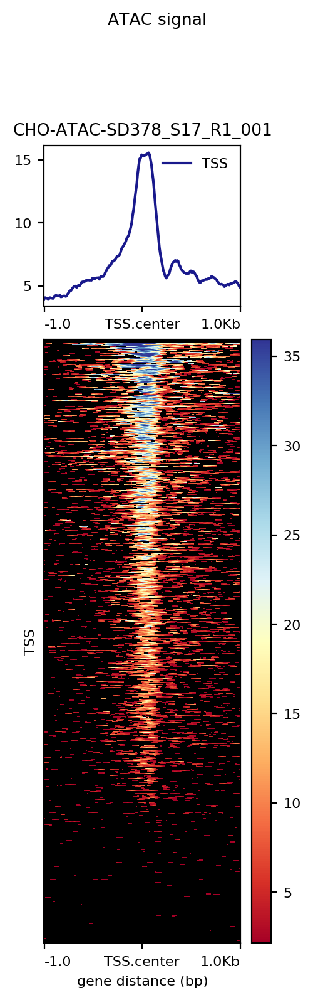

In [56]:
bigwig = '../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw'
tss_bed = 'Results/peak_groups/confident_promoter_t2_cpm1.bed'
outfile = 'Results/ATAC_results/confident_promoter_t2_cpm1'

run_heatmap(tss_bed,bigwig,outfile,dist=1000,numProc=6,dispImage = True)

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/peak_groups/confident_enhancer_t2_cpm1.bed -a 1000 -b 1000 -out Results/ATAC_results/confident_enhancer_t2_cpm1 --numberOfProcessors 6
plotHeatmap     -m Results/ATAC_results/confident_enhancer_t2_cpm1     -out Results/ATAC_results/confident_enhancer_t2_cpm1.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal'
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



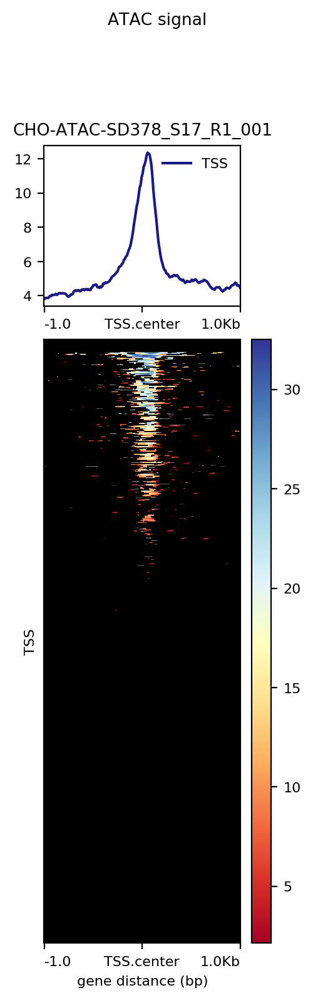

In [59]:
tss_bed = 'Results/peak_groups/confident_enhancer_t2_cpm1.bed'
outfile = 'Results/ATAC_results/confident_enhancer_t2_cpm1'
run_heatmap(tss_bed,bigwig,outfile,dist=1000,numProc=6,dispImage = True)

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/peak_groups/noPeaks.bed -a 1000 -b 1000 -out Results/ATAC_results/noPeaks --numberOfProcessors 6
Skipping ID=asmbl_7400;Parent=gene_2515;gene_id=gene_2515;gene=CYB5R3;transcript_id=asmbl_7400;cs=2, due to being absent in the computeMatrix output.
Skipping ID=asmbl_8943;Parent=gene_3015;gene_id=gene_3015;gene=IGHV3-6;transcript_id=asmbl_8943;cs=4, due to being absent in the computeMatrix output.
Skipping ID=asmbl_8945;Parent=gene_3017;gene_id=gene_3017;gene=H2AFB3;transcript_id=asmbl_8945;cs=2, due to being absent in the computeMatrix output.
Skipping ID=asmbl_9042;Parent=gene_3057;gene_id=gene_3057;gene=SLC25A16;transcript_id=asmbl_9042;cs=3, due to being absent in the computeMatrix output.
Skipping ID=asmbl_9043;Parent=gene_3058;gene_id=gene_3058;gene=TET1;transcript_id=asmbl_9043;cs=1, due to being absent in the computeMatrix output.
Skipping ID=asmbl_9603;Parent=gene_3251;gene

/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



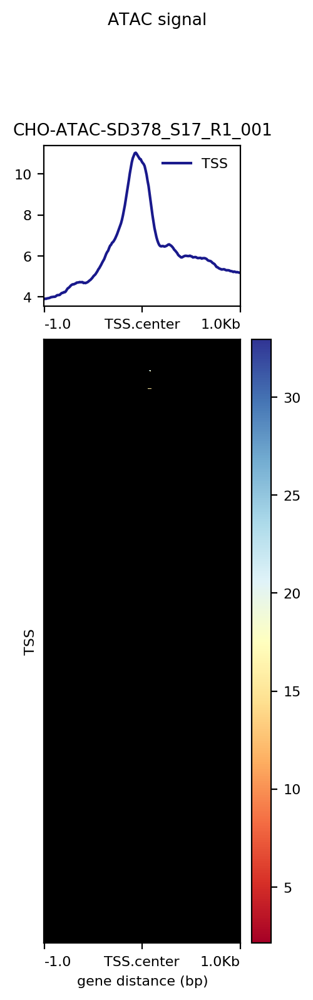

In [60]:
tss_bed = 'Results/peak_groups/noPeaks.bed'
outfile = 'Results/ATAC_results/noPeaks'
run_heatmap(tss_bed,bigwig,outfile,dist=1000,numProc=6,dispImage = True)

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/peak_groups/highQuartile.bed -a 1000 -b 1000 -out Results/ATAC_results/highQuartile --numberOfProcessors 6
plotHeatmap     -m Results/ATAC_results/highQuartile     -out Results/ATAC_results/highQuartile.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal'
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



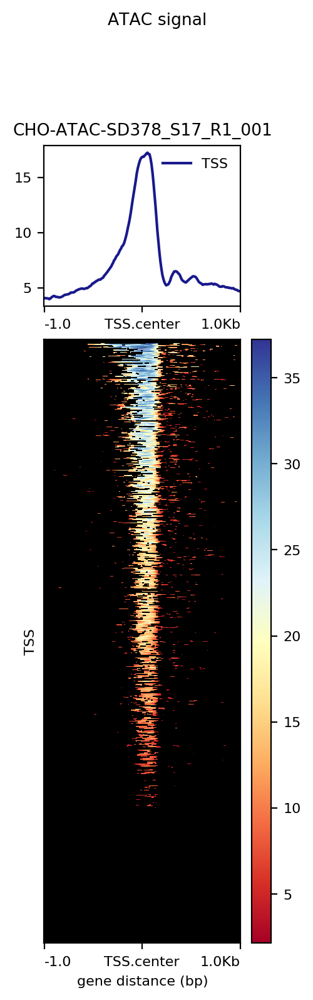

In [61]:
tss_bed = 'Results/peak_groups/highQuartile.bed'
outfile = 'Results/ATAC_results/highQuartile'
run_heatmap(tss_bed,bigwig,outfile,dist=1000,numProc=6,dispImage = True)

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/peak_groups/twentyFive_val.bed -a 1000 -b 1000 -out Results/ATAC_results/twentyFiveQuartile --numberOfProcessors 6
plotHeatmap     -m Results/ATAC_results/twentyFiveQuartile     -out Results/ATAC_results/twentyFiveQuartile.png      --heatmapHeight 15       --refPointLabel TSS.center      --regionsLabel TSS      --plotTitle 'ATAC signal'
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:

Mean of empty slice



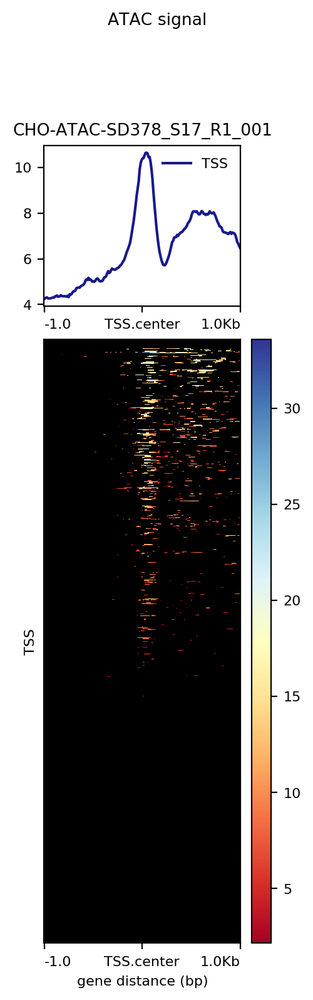

In [63]:
tss_bed = 'Results/peak_groups/twentyFive_val.bed'
outfile = 'Results/ATAC_results/twentyFiveQuartile'
run_heatmap(tss_bed,bigwig,outfile,dist=1000,numProc=6,dispImage = True)

# Include TSS side-by-side heatmap